In [1]:
%load_ext autoreload
%autoreload 2
    
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML 
import warnings
import os

import sys
sys.path.append('/home/belle/zhangboy/inclusive_R_D/')
import utilities as util
# Path to scripts on KEKCC
sys_path = '/group/belle2/dataprod/Systematics/systematic_corrections_framework/scripts'
sys.path.insert(1, sys_path)

import weight_table as wm
from show_db_content import show_db_content
from show_variables import show_ntuple_variables
import show_collections as sc

In [3]:
from common_methods import DF_SCHEMES
for schema in DF_SCHEMES:
    print(schema, DF_SCHEMES[schema])

Dst  type: Weighted
Particles: ['K', 'pi']
Prefixes:  ['DST_D0_K', 'DST_D0_pi']
Constraints:
For K particle: nCDCHits > 20 and p > 0.3
For pi particle: nCDCHits > 20 and p > 0.1
Lambda0  type: Weighted
Particles: ['p', 'pi']
Prefixes:  ['Lambda0_p', 'Lambda0_pi']
Constraints:
For p particle: nCDCHits > 20 and p > 0.5
For pi particle: nCDCHits > 20 and p > 0.1 and p < 0.75
KShort  type: Weighted
Particles: ['pi', 'pi']
Prefixes:  ['KS_pi1', 'KS_pi2']
Constraints:
For pi particle: nCDCHits > 20 and p > 0.1
For pi particle: nCDCHits > 20 and p > 0.1
Jpsiee  type: Weighted
Particles: ['e', 'e']
Prefixes:  ['e0', 'e1']
Constraints:
For e particle: p > 1.5
For e particle: p > 1.5
Tag cuts:
For prefix e1_: e0_{variable} > 0.9
For prefix e0_: e1_{variable} > 0.9
Jpsimumu  type: Weighted
Particles: ['mu', 'mu']
Prefixes:  ['mu0', 'mu1']
Constraints:
For mu particle: p > 1.5
For mu particle: p > 1.5
Tag cuts:
For prefix mu1_: mu0_{variable} > 0.9
For prefix mu0_: mu1_{variable} > 0.9
Radmumu  ty

In [121]:
ds_collections = sc.show_collections(type='html', compactify=True)
HTML(ds_collections)

,Datasets,Description
Collection,,
proc16+prompt,proc16_offres proc16_chunk1-4 prompt16_offres prompt16,"Belle II data including Run1, and Run2 up to experiment 35, includes 4S and 4S_offres"
MC16rd_proc16+prompt,MC16rd_p16_offres MC16rd_p16_chunk1-4 MC16rd_prompt_offres MC16rd_prompt,Belle II rd MC corresponding to proc16+prompt
proc13+prompt,proc13_chunk1-5 bucket26-36,"Belle II data until 2022c period of 404fb$^{-1}$, includes 4S, 4S_offres and 5S_scan energies"
MC15ri,MC15ri_1-2,Run-independent MC15 of 400fb$^{-1}$
MC15rd_proc13+prompt,MC15rd_p13_chunk1-5 MC15rd_p13_e20-26,Run-dependent MC15 that corresponds to proc13 dataset
proc12+prompt,proc12e7-12 bucket16-25 bucket19a,"Belle II data until 2021c period of 190fb$^{-1}$, 4S only"
MC14ri,MC14ri_1-2,Run-independent MC of 200fb$^{-1}$
MC14rd_proc12+prompt,MC14rd_e7-12 MC14rd_bucket16-25,Run-dependent MC that corresponds to proc12 dataset
sproc3,sproc3,Validation data sample for release-06 that corresponds to bucket25. Please use proc13+prompt collection or bucket25 sample for physics instead.


# electronIDNN

In [ ]:
import pandas as pd
e_eff_Jpsiee = pd.read_csv('../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_Jpsiee.csv')
e_eff_TwophotonEe = pd.read_csv('../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_TwophotonEe.csv')
e_eff_TwophotonEe_low_p = e_eff_TwophotonEe.query('p_max<=1.5').copy()
e_eff_combined = pd.concat([e_eff_Jpsiee, e_eff_TwophotonEe_low_p], ignore_index=True)
e_eff_combined.to_csv('../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_combined.csv')

In [ ]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "electronIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [list(np.linspace(0.3, 1.9, 9)) + [2.2, 2.5, 3, 4],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_run1_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run1_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

Number of p bins: 13, [0.3, 0.5, 0.7, 0.8999999999999999, 1.1, 1.2999999999999998, 1.5, 1.7, 1.9, 2.2, 2.5, 3.0, 4.0]
Number of cosTheta bins: 9, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


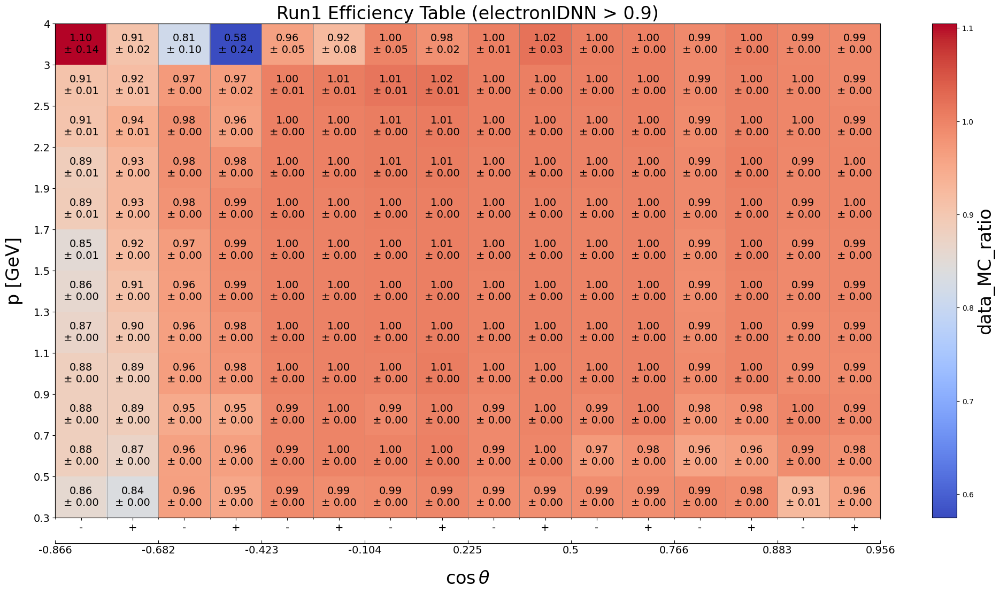

In [5]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    # charge = -1,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_efficiency_run1_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_efficiency_run1_TwophotonEe.png',)

In [ ]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "electronIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [list(np.linspace(0.3, 1.9, 9)) + [2.2, 2.5, 3, 4],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_run2_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run2_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

Number of p bins: 13, [0.3, 0.5, 0.7, 0.8999999999999999, 1.1, 1.2999999999999998, 1.5, 1.7, 1.9, 2.2, 2.5, 3.0, 4.0]
Number of cosTheta bins: 9, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


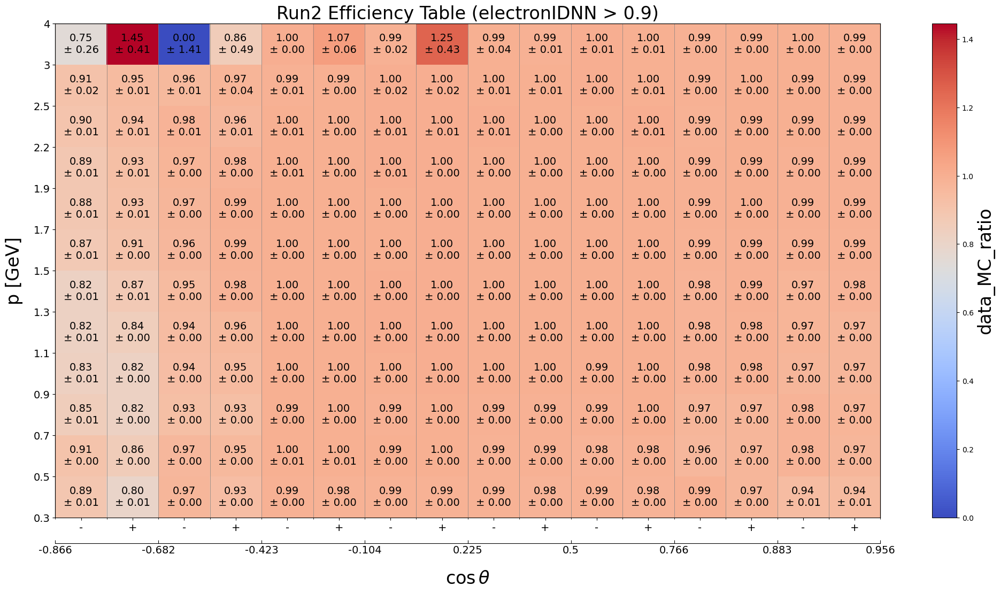

In [6]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    # charge = -1,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_efficiency_run2_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_efficiency_run2_TwophotonEe.png',)

In [4]:
pi_e_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],
    "cut": "electronIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 1, 1.5, 3,],
                [-0.866, -0.4226, 0.225, 0.766, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_e_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_e_fake_MC16rd_run1_coarse_08.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_e_fake = wm.produce_data_mc_ratio(**pi_e_fake_ratio_cfg)
# pi_e_fake.plot()
pi_e_fake_table = pi_e_fake.create_weights()
pi_e_fake_table

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:03<00:53,  3.80s/it]

 13%|█████▊                                      | 2/15 [00:10<01:09,  5.34s/it]

 20%|████████▊                                   | 3/15 [00:14<00:57,  4.78s/it]

 27%|███████████▋                                | 4/15 [00:20<00:59,  5.43s/it]

 33%|██████████████▋                             | 5/15 [00:25<00:52,  5.20s/it]

 40%|█████████████████▌                          | 6/15 [00:33<00:54,  6.06s/it]

 47%|████████████████████▌                       | 7/15 [00:54<01:27, 10.98s/it]

 53%|███████████████████████▍                    | 8/15 [01:02<01:10, 10.07s/it]

 60%|██████████████████████████▍                 | 9/15 [01:25<01:24, 14.01s/it]

 67%|████████████████████████████▋              | 10/15 [01:36<01:05, 13.12s/it]

 73%|███████████████████████████████▌           | 11/15 [01:57<01:02, 15.68s/it]

 80%|██████████████████████████████████▍        | 12/15 [03:39<02:05, 41.71s/it]

 87%|█████████████████████████████████████▎     | 13/15 [04:08<01:15, 37.92s/it]

 93%|████████████████████████████████████████▏  | 14/15 [05:59<01:00, 60.08s/it]

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:14<03:20, 14.31s/it]

 13%|█████▊                                      | 2/15 [00:26<02:51, 13.18s/it]

 20%|████████▊                                   | 3/15 [00:33<02:03, 10.26s/it]

 27%|███████████▋                                | 4/15 [00:38<01:31,  8.32s/it]

 33%|██████████████▋                             | 5/15 [00:46<01:22,  8.23s/it]

 40%|█████████████████▌                          | 6/15 [01:31<03:06, 20.73s/it]

 47%|████████████████████▌                       | 7/15 [02:21<04:00, 30.10s/it]

 53%|███████████████████████▍                    | 8/15 [02:56<03:41, 31.63s/it]

 60%|██████████████████████████▍                 | 9/15 [03:19<02:55, 29.18s/it]

 67%|████████████████████████████▋              | 10/15 [03:40<02:12, 26.49s/it]

 73%|███████████████████████████████▌           | 11/15 [05:32<03:31, 52.77s/it]

 80%|██████████████████████████████████▍        | 12/15 [07:15<03:24, 68.08s/it]

 87%|█████████████████████████████████████▎     | 13/15 [07:58<02:00, 60.49s/it]

 93%|████████████████████████████████████████▏  | 14/15 [08:27<00:50, 50.80s/it]

100%|███████████████████████████████████████████| 15/15 [08:46<00:00, 35.13s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,1.0,-0.8660,-0.4226,-2,0,3.258597,0.014019,0.014019,0.146542,...,0.000076,0.000278,0.000278,0.003661,0.000046,0.000046,0.001754,0.001754,0.9,electronIDNN
1,0.3,1.0,-0.8660,-0.4226,0,2,2.967525,0.013970,0.013970,0.146302,...,0.000080,0.000353,0.000353,0.003970,0.000048,0.000048,0.002574,0.002574,0.9,electronIDNN
2,0.3,1.0,-0.4226,0.2250,-2,0,4.307967,0.036039,0.036039,0.783857,...,0.000032,0.000289,0.000289,0.000717,0.000025,0.000025,0.000380,0.000380,0.9,electronIDNN
3,0.3,1.0,-0.4226,0.2250,0,2,4.800803,0.031198,0.031198,0.850498,...,0.000034,0.000317,0.000317,0.000849,0.000025,0.000025,0.000389,0.000389,0.9,electronIDNN
4,0.3,1.0,0.2250,0.7660,-2,0,3.414421,0.015842,0.015842,0.311522,...,0.000031,0.000210,0.000210,0.001522,0.000022,0.000022,0.000346,0.000346,0.9,electronIDNN
5,0.3,1.0,0.2250,0.7660,0,2,3.655220,0.017177,0.017177,0.376041,...,0.000031,0.000222,0.000222,0.001392,0.000022,0.000022,0.000408,0.000408,0.9,electronIDNN
6,0.3,1.0,0.7660,0.9563,-2,0,4.252067,0.027127,0.027127,0.561378,...,0.000061,0.000197,0.000197,0.001510,0.000038,0.000038,0.001087,0.001087,0.9,electronIDNN
7,0.3,1.0,0.7660,0.9563,0,2,4.619375,0.029148,0.029148,0.681471,...,0.000060,0.000205,0.000205,0.001356,0.000037,0.000037,0.001188,0.001188,0.9,electronIDNN
8,1.0,1.5,-0.8660,-0.4226,-2,0,3.449626,0.079082,0.079082,0.265401,...,0.000136,0.000322,0.000322,0.001002,0.000069,0.000069,0.000115,0.000115,0.9,electronIDNN
9,1.0,1.5,-0.8660,-0.4226,0,2,3.627213,0.062935,0.062935,0.469279,...,0.000185,0.000624,0.000624,0.001461,0.000077,0.000077,0.000205,0.000205,0.9,electronIDNN


Number of p bins: 3, [0.3, 1.0, 1.5, 3.0]
Number of cosTheta bins: 4, [-0.866, -0.4226, 0.225, 0.766, 0.9563]


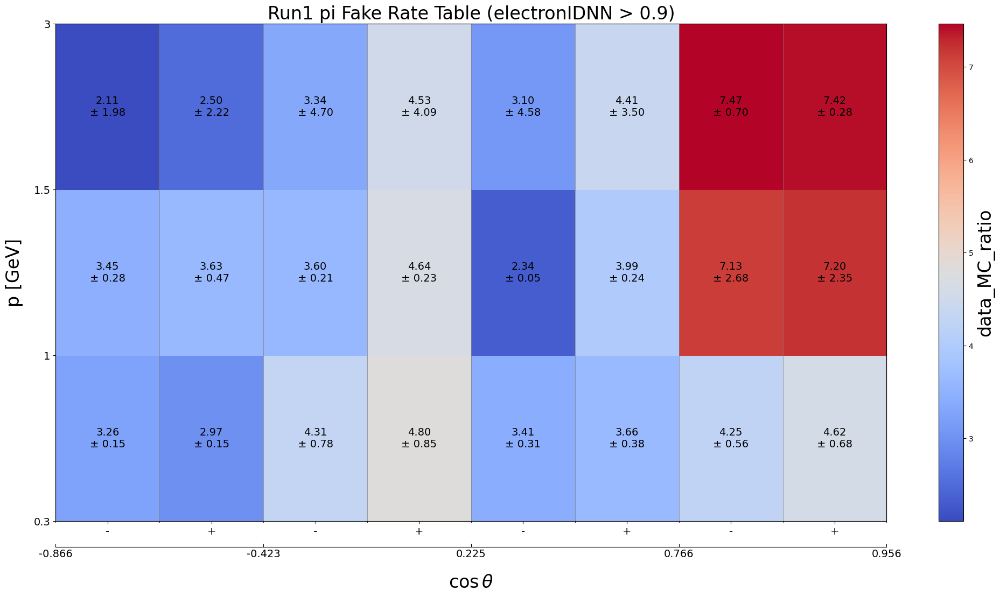

In [5]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    # charge = -1,
    plot_graph = False,
    max_zlim = 5,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_e_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_e_fake_run1.png',)

In [16]:
pi_e_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],
    "cut": "electronIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 1, 1.5, 3,],
                [-0.866, -0.6, 0, 0.7, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_e_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_e_fake_MC16rd_run2_coarse_08.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_e_fake = wm.produce_data_mc_ratio(**pi_e_fake_ratio_cfg)
# pi_e_fake.plot()
pi_e_fake_table = pi_e_fake.create_weights()
pi_e_fake_table

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:03<00:16,  3.22s/it]

 33%|███████████████                              | 2/6 [00:09<00:19,  4.76s/it]

 50%|██████████████████████▌                      | 3/6 [00:12<00:12,  4.29s/it]

 67%|██████████████████████████████               | 4/6 [00:33<00:21, 10.69s/it]

 83%|█████████████████████████████████████▌       | 5/6 [00:53<00:14, 14.12s/it]

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:13<01:07, 13.41s/it]

 33%|███████████████                              | 2/6 [00:19<00:35,  8.84s/it]

 50%|██████████████████████▌                      | 3/6 [01:13<01:28, 29.56s/it]

 67%|██████████████████████████████               | 4/6 [01:22<00:43, 21.60s/it]

 83%|█████████████████████████████████████▌       | 5/6 [03:12<00:53, 53.42s/it]

100%|█████████████████████████████████████████████| 6/6 [03:22<00:00, 33.71s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,1.0,-0.866,-0.6000,-2,0,3.766802,0.030682,0.030682,0.650262,...,0.000180,0.001687,0.001687,0.004036,0.000114,0.000114,0.002939,0.002939,0.9,electronIDNN
1,0.3,1.0,-0.866,-0.6000,0,2,2.926137,0.029467,0.029467,0.665954,...,0.000188,0.002367,0.002367,0.004832,0.000127,0.000127,0.004260,0.004260,0.9,electronIDNN
2,0.3,1.0,-0.600,0.0000,-2,0,4.623302,0.058330,0.058330,0.657998,...,0.000059,0.000425,0.000425,0.000872,0.000049,0.000049,0.000373,0.000373,0.9,electronIDNN
3,0.3,1.0,-0.600,0.0000,0,2,4.583425,0.060204,0.060204,0.945974,...,0.000061,0.000136,0.000136,0.000868,0.000051,0.000051,0.000495,0.000495,0.9,electronIDNN
4,0.3,1.0,0.000,0.7000,-2,0,4.131754,0.032762,0.032762,0.234149,...,0.000045,0.000662,0.000662,0.001158,0.000036,0.000036,0.000461,0.000461,0.9,electronIDNN
5,0.3,1.0,0.000,0.7000,0,2,3.713498,0.031325,0.031325,0.352105,...,0.000045,0.000391,0.000391,0.001246,0.000037,0.000037,0.000399,0.000399,0.9,electronIDNN
6,0.3,1.0,0.700,0.9563,-2,0,3.837087,0.034859,0.034859,0.252485,...,0.000079,0.000551,0.000551,0.001757,0.000058,0.000058,0.000888,0.000888,0.9,electronIDNN
7,0.3,1.0,0.700,0.9563,0,2,3.387878,0.038150,0.038150,0.486619,...,0.000075,0.000038,0.000038,0.001610,0.000057,0.000057,0.000940,0.000940,0.9,electronIDNN
8,1.0,1.5,-0.866,-0.6000,-2,0,5.888951,0.238365,0.238365,1.712096,...,0.000333,0.000673,0.000673,0.000712,0.000160,0.000160,0.000117,0.000117,0.9,electronIDNN
9,1.0,1.5,-0.866,-0.6000,0,2,5.745622,0.167858,0.167858,2.638041,...,0.000484,0.002667,0.002667,0.001187,0.000180,0.000180,0.000192,0.000192,0.9,electronIDNN


Number of p bins: 3, [0.3, 1.0, 1.5, 3.0]
Number of cosTheta bins: 4, [-0.866, -0.6, 0.0, 0.7, 0.9563]


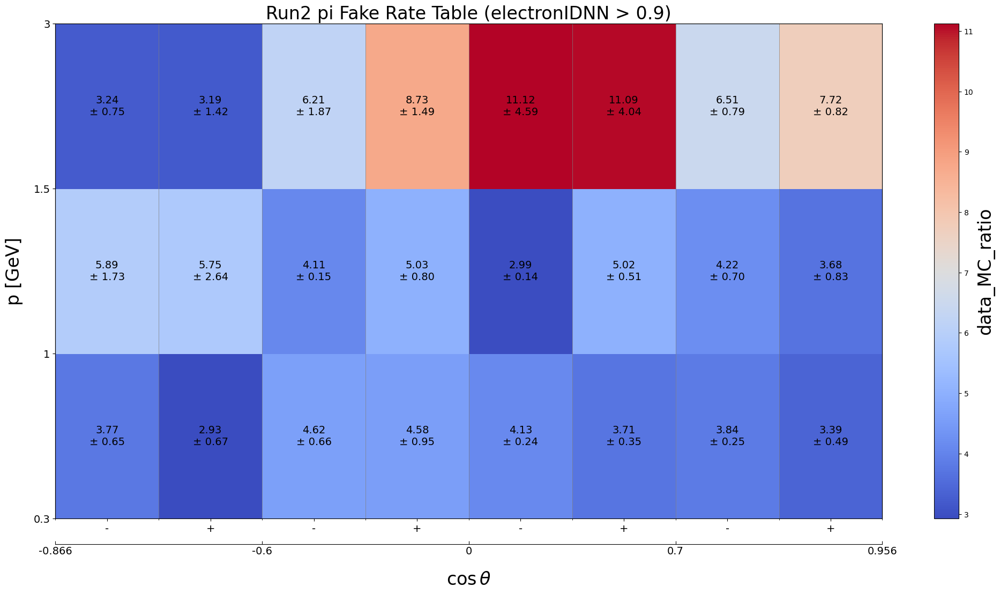

In [17]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    max_zlim = 15,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_e_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_e_fake_run2.png',)

In [8]:
K_e_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "electronIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 0.5, 1.2, 1.5, 1.8, 2.1, 2.5, 3],
                [-0.866, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/K_e_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/K_e_fake_MC16rd_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

K_e_fake = wm.produce_data_mc_ratio(**K_e_fake_ratio_cfg)
# K_e_fake.plot()
K_e_fake_table = K_e_fake.create_weights()
K_e_fake_table

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:03<00:13,  3.27s/it]

 40%|██████████████████                           | 2/5 [00:08<00:14,  4.69s/it]

 60%|███████████████████████████                  | 3/5 [00:12<00:07,  3.99s/it]

 80%|████████████████████████████████████         | 4/5 [00:17<00:04,  4.58s/it]

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:14<00:56, 14.01s/it]

 40%|██████████████████                           | 2/5 [00:26<00:38, 12.83s/it]

 60%|███████████████████████████                  | 3/5 [00:33<00:20, 10.28s/it]

 80%|████████████████████████████████████         | 4/5 [00:38<00:08,  8.34s/it]

100%|█████████████████████████████████████████████| 5/5 [00:46<00:00,  9.23s/it]
INFO: Number of excluded negative values: 19 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,0.5,-0.8660,-0.4226,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.000848,0.000727,0.000727,0.000922,0.000272,0.000272,0.000558,0.000558,0.9,electronIDNN
1,0.3,0.5,-0.8660,-0.4226,0,2,0.991016,0.809189,0.809189,1.119793,...,0.000874,0.000624,0.000624,0.001140,0.000272,0.000272,0.000550,0.000550,0.9,electronIDNN
2,0.3,0.5,-0.4226,-0.1045,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.000812,0.000611,0.000611,-0.000122,0.000283,0.000283,0.000122,0.000122,0.9,electronIDNN
3,0.3,0.5,-0.4226,-0.1045,0,2,0.000000,1.000000,1.000000,1.000000,...,0.000680,0.000571,0.000571,0.000667,0.000293,0.000293,0.000613,0.000613,0.9,electronIDNN
4,0.3,0.5,-0.1045,0.2250,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.000882,0.000845,0.000845,0.000732,0.000310,0.000310,0.000709,0.000709,0.9,electronIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,2.5,3.0,0.2250,0.5000,0,2,0.040706,26.017296,26.017296,3.320282,...,0.000195,0.000124,0.000124,0.000184,0.000075,0.000075,0.000143,0.000143,0.9,electronIDNN
80,2.5,3.0,0.5000,0.7660,-2,0,5.866788,1.019596,1.019596,5.293418,...,0.000178,0.000098,0.000098,0.000065,0.000059,0.000059,0.000048,0.000048,0.9,electronIDNN
81,2.5,3.0,0.5000,0.7660,0,2,0.976384,0.882697,0.882697,2.474060,...,0.000154,0.000087,0.000087,0.000190,0.000059,0.000059,0.000179,0.000179,0.9,electronIDNN
82,2.5,3.0,0.7660,0.9563,-2,0,0.877084,1.829290,1.829290,3.039496,...,0.000228,0.000222,0.000222,0.000146,0.000061,0.000061,0.000132,0.000132,0.9,electronIDNN


Number of p bins: 7, [0.3, 0.5, 1.2, 1.5, 1.8, 2.1, 2.5, 3.0]
Number of cosTheta bins: 6, [-0.866, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.9563]


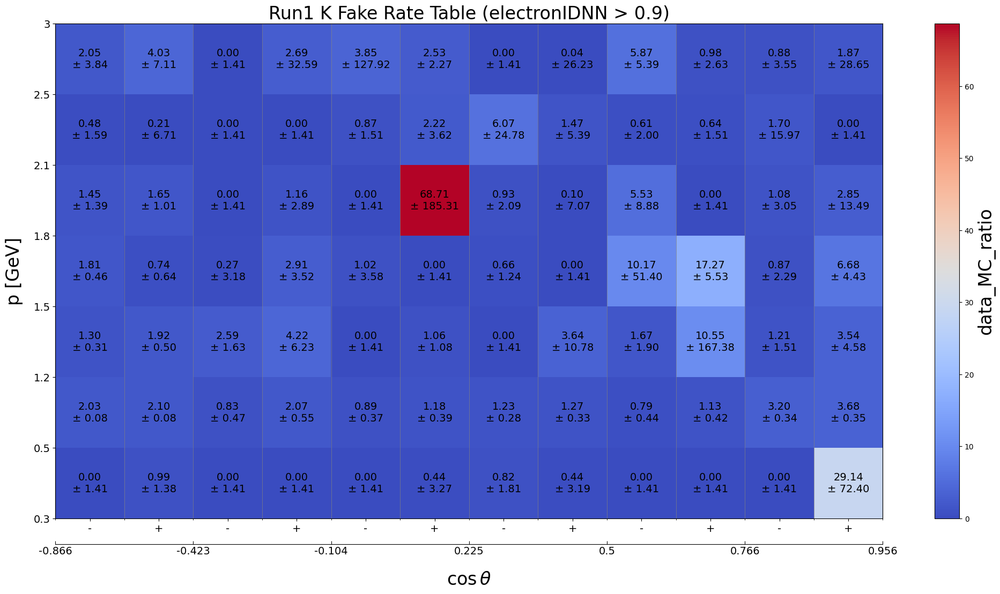

In [9]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_e_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_e_fake_run1.png',)

In [10]:
K_e_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "electronIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 0.5, 1.2, 1.5, 1.8, 2.1, 2.5, 3],
                [-0.866, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/K_e_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/K_e_fake_MC16rd_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

K_e_fake = wm.produce_data_mc_ratio(**K_e_fake_ratio_cfg)
# K_e_fake.plot()
K_e_fake_table = K_e_fake.create_weights()
K_e_fake_table

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:02<00:02,  2.61s/it]

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:13<00:13, 13.57s/it]

100%|█████████████████████████████████████████████| 2/2 [00:19<00:00,  9.68s/it]
INFO: Number of excluded negative values: 43 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,0.5,-0.8660,-0.4226,-2,0,0.400932,16.053322,16.053322,2.652211,...,0.001369,0.000944,0.000944,0.000214,0.000412,0.000412,0.000010,0.000010,0.9,electronIDNN
1,0.3,0.5,-0.8660,-0.4226,0,2,0.000000,1.000000,1.000000,1.000000,...,0.001162,0.000764,0.000764,0.001346,0.000515,0.000515,0.000424,0.000424,0.9,electronIDNN
2,0.3,0.5,-0.4226,-0.1045,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.001335,0.000669,0.000669,0.001752,0.000571,0.000571,0.001681,0.001681,0.9,electronIDNN
3,0.3,0.5,-0.4226,-0.1045,0,2,0.000000,1.000000,1.000000,1.000000,...,0.001279,0.000460,0.000460,-0.000211,0.000491,0.000491,0.000211,0.000211,0.9,electronIDNN
4,0.3,0.5,-0.1045,0.2250,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.001403,0.000666,0.000666,-0.000087,0.000547,0.000547,0.000396,0.000396,0.9,electronIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,2.5,3.0,0.2250,0.5000,0,2,0.000000,1.000000,1.000000,1.000000,...,0.000369,0.000125,0.000125,-0.000135,0.000122,0.000122,0.000152,0.000152,0.9,electronIDNN
80,2.5,3.0,0.5000,0.7660,-2,0,1.089736,1.303017,1.303017,0.243947,...,0.000308,0.000097,0.000097,0.000233,0.000111,0.000111,0.000188,0.000188,0.9,electronIDNN
81,2.5,3.0,0.5000,0.7660,0,2,0.000000,1.000000,1.000000,1.000000,...,0.000235,0.000167,0.000167,-0.000023,0.000079,0.000079,0.000038,0.000038,0.9,electronIDNN
82,2.5,3.0,0.7660,0.9563,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.000393,0.000159,0.000159,-0.000079,0.000087,0.000087,0.000098,0.000098,0.9,electronIDNN


Number of p bins: 7, [0.3, 0.5, 1.2, 1.5, 1.8, 2.1, 2.5, 3.0]
Number of cosTheta bins: 6, [-0.866, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.9563]


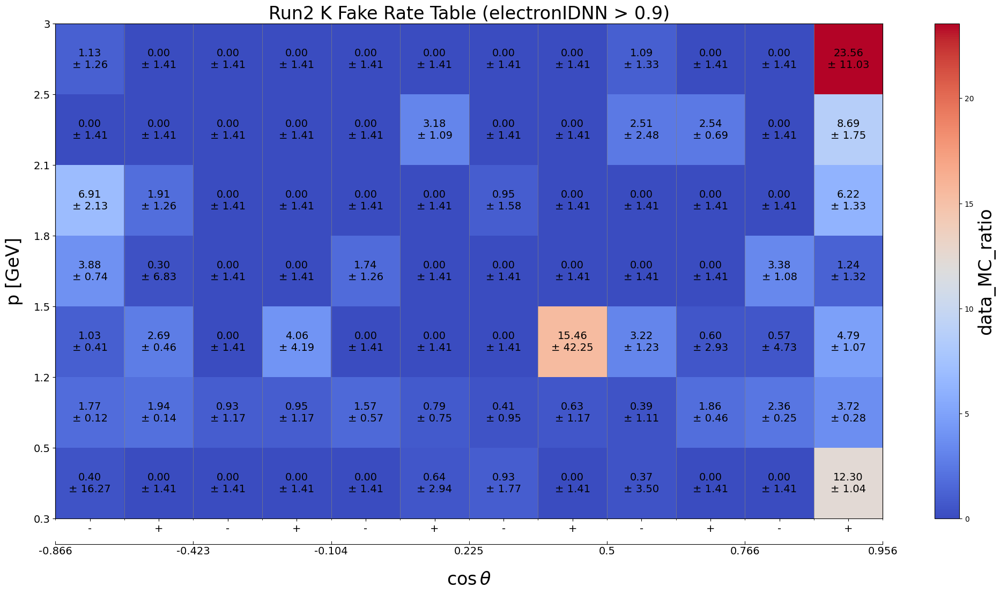

In [11]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'electronIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_e_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_e_fake_run2.png',)

# muonIDNN

In [8]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["Radmumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[1.5, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_Radmumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_run1_Radmumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

 30%|█████████████▏                              | 6/20 [00:36<00:46,  3.30s/it]

 50%|█████████████████████▌                     | 10/20 [00:46<00:29,  2.92s/it]

100%|█████████████████████████████████████████████| 5/5 [00:28<00:00,  5.78s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,1.5,1.8,-0.8660,-0.6820,-2,0,1.035610,0.004425,0.004425,0.000003,...,0.002905,0.0,0.0,0.713753,0.001452,0.001452,0.0,0.0,0.9,muonIDNN
1,1.5,1.8,-0.8660,-0.6820,0,2,1.091544,0.007966,0.007966,0.000013,...,0.005020,0.0,0.0,0.659796,0.002544,0.002544,0.0,0.0,0.9,muonIDNN
2,1.5,1.8,-0.6820,-0.4226,-2,0,1.017702,0.003762,0.003762,0.000004,...,0.002511,0.0,0.0,0.735960,0.001256,0.001256,0.0,0.0,0.9,muonIDNN
3,1.5,1.8,-0.6820,-0.4226,0,2,1.025227,0.006069,0.006069,0.000009,...,0.003727,0.0,0.0,0.671048,0.001836,0.001836,0.0,0.0,0.9,muonIDNN
4,1.5,1.8,-0.4226,-0.1045,-2,0,0.912778,0.002417,0.002417,0.000004,...,0.001946,0.0,0.0,0.926584,0.000686,0.000686,0.0,0.0,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,3.0,3.5,0.5000,0.7660,0,2,0.963944,0.003519,0.003519,0.000046,...,0.002775,0.0,0.0,0.886408,0.001202,0.001202,0.0,0.0,0.9,muonIDNN
92,3.0,3.5,0.7660,0.8829,-2,0,1.017619,0.007485,0.007485,0.000103,...,0.006096,0.0,0.0,0.899047,0.003066,0.003066,0.0,0.0,0.9,muonIDNN
93,3.0,3.5,0.7660,0.8829,0,2,1.028364,0.004277,0.004277,0.000041,...,0.003435,0.0,0.0,0.882154,0.001755,0.001755,0.0,0.0,0.9,muonIDNN
94,3.0,3.5,0.8829,0.9563,-2,0,1.038411,0.021331,0.021331,0.000198,...,0.015242,0.0,0.0,0.770249,0.007382,0.007382,0.0,0.0,0.9,muonIDNN


Number of p bins: 6, [1.5, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


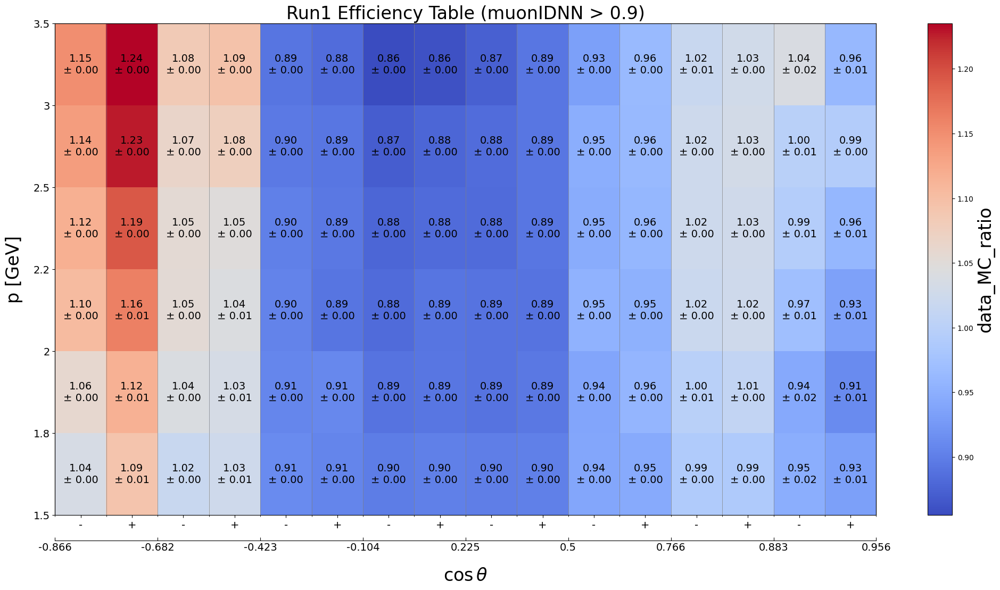

In [9]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_Radmumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_Radmumu.png',)

In [10]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["Radmumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[1.5, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_Radmumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_run2_Radmumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

100%|█████████████████████████████████████████████| 2/2 [00:29<00:00, 14.86s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,1.5,1.8,-0.8660,-0.6820,-2,0,0.906686,0.003679,0.003679,0.000633,...,0.002631,0.0,0.0,0.842096,0.001085,0.001085,0.0,0.0,0.9,muonIDNN
1,1.5,1.8,-0.8660,-0.6820,0,2,0.891797,0.004929,0.004929,0.000933,...,0.003428,0.0,0.0,0.829615,0.001394,0.001394,0.0,0.0,0.9,muonIDNN
2,1.5,1.8,-0.6820,-0.4226,-2,0,0.961223,0.003195,0.003195,0.000761,...,0.002273,0.0,0.0,0.816027,0.001099,0.001099,0.0,0.0,0.9,muonIDNN
3,1.5,1.8,-0.6820,-0.4226,0,2,0.947596,0.004365,0.004365,0.001035,...,0.002910,0.0,0.0,0.774185,0.001412,0.001412,0.0,0.0,0.9,muonIDNN
4,1.5,1.8,-0.4226,-0.1045,-2,0,0.901839,0.002685,0.002685,0.000746,...,0.002120,0.0,0.0,0.918219,0.000742,0.000742,0.0,0.0,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,3.0,3.5,0.5000,0.7660,0,2,0.943668,0.001523,0.001523,0.000436,...,0.001239,0.0,0.0,0.919039,0.000485,0.000485,0.0,0.0,0.9,muonIDNN
92,3.0,3.5,0.7660,0.8829,-2,0,0.975201,0.001970,0.001970,0.000795,...,0.001685,0.0,0.0,0.943204,0.000684,0.000684,0.0,0.0,0.9,muonIDNN
93,3.0,3.5,0.7660,0.8829,0,2,0.980236,0.001558,0.001558,0.000527,...,0.001327,0.0,0.0,0.941571,0.000566,0.000566,0.0,0.0,0.9,muonIDNN
94,3.0,3.5,0.8829,0.9563,-2,0,0.975461,0.004374,0.004374,0.000965,...,0.003138,0.0,0.0,0.804355,0.001424,0.001424,0.0,0.0,0.9,muonIDNN


Number of p bins: 6, [1.5, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


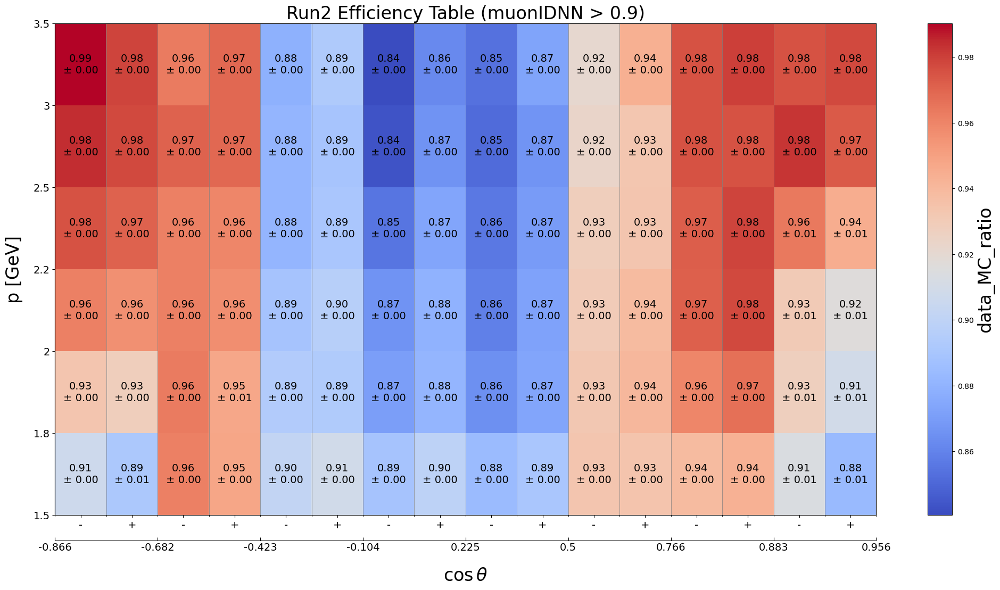

In [11]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_Radmumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_Radmumu.png',)

In [12]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["TwophotonMumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_TwophotonMumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_TwophotonMumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

 10%|████▍                                       | 3/30 [03:11<21:32, 47.85s/it]

 30%|█████████████▏                              | 9/30 [03:32<02:33,  7.33s/it]

 37%|███████████████▊                           | 11/30 [03:34<01:18,  4.16s/it]

 50%|█████████████████████▌                     | 15/30 [04:30<02:21,  9.43s/it]

 70%|██████████████████████████████             | 21/30 [05:21<01:25,  9.49s/it]

 90%|██████████████████████████████████████▋    | 27/30 [08:44<01:42, 34.11s/it]

100%|█████████████████████████████████████████████| 5/5 [05:21<00:00, 64.26s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,0.7,-0.8660,-0.6820,-2,0,0.581254,0.008541,0.008541,0.007665,...,0.001051,0.0,0.0,0.262925,0.001331,0.001331,0.0,0.0,0.9,muonIDNN
1,0.5,0.7,-0.8660,-0.6820,0,2,0.544746,0.010354,0.010354,0.007338,...,0.000820,0.0,0.0,0.183771,0.001164,0.001164,0.0,0.0,0.9,muonIDNN
2,0.5,0.7,-0.6820,-0.4226,-2,0,0.649012,0.002138,0.002138,0.029449,...,0.000210,0.0,0.0,0.175149,0.000190,0.000190,0.0,0.0,0.9,muonIDNN
3,0.5,0.7,-0.6820,-0.4226,0,2,0.682311,0.002091,0.002091,0.030732,...,0.000206,0.0,0.0,0.169361,0.000185,0.000185,0.0,0.0,0.9,muonIDNN
4,0.5,0.7,-0.4226,-0.1045,-2,0,1.019727,0.000821,0.000821,0.093675,...,0.000403,0.0,0.0,0.564408,0.000242,0.000242,0.0,0.0,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.6,3.0,0.5000,0.7660,0,2,0.971700,0.002163,0.002163,0.006383,...,0.001550,0.0,0.0,0.887892,0.001069,0.001069,0.0,0.0,0.9,muonIDNN
156,2.6,3.0,0.7660,0.8829,-2,0,1.018019,0.001403,0.001403,0.003291,...,0.000938,0.0,0.0,0.897446,0.000858,0.000858,0.0,0.0,0.9,muonIDNN
157,2.6,3.0,0.7660,0.8829,0,2,1.024422,0.001478,0.001478,0.003315,...,0.000974,0.0,0.0,0.884516,0.000897,0.000897,0.0,0.0,0.9,muonIDNN
158,2.6,3.0,0.8829,0.9563,-2,0,0.953451,0.001863,0.001863,0.001117,...,0.001234,0.0,0.0,0.909848,0.001094,0.001094,0.0,0.0,0.9,muonIDNN


Number of p bins: 10, [0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


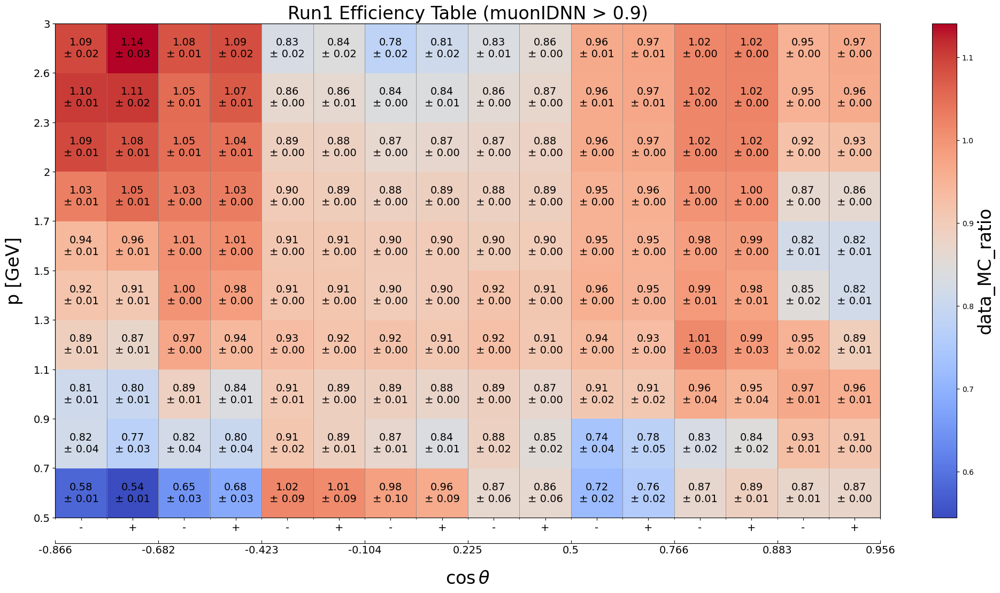

In [13]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_TwophotonMumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run1_TwophotonMumu.png',)

In [14]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["TwophotonMumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_TwophotonMumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_TwophotonMumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

100%|█████████████████████████████████████████████| 2/2 [00:14<00:00,  7.22s/it]
INFO: Number of excluded negative values: 1 
INFO: Excluded values are shown as hashed regions.
 25%|███████████                                 | 3/12 [03:21<07:30, 50.00s/it]

 75%|█████████████████████████████████           | 9/12 [03:53<00:27,  9.32s/it]

100%|█████████████████████████████████████████████| 2/2 [01:18<00:00, 39.37s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,0.7,-0.8660,-0.6820,-2,0,0.536229,0.012312,0.012312,0.009936,...,0.002000,0.0,0.0,0.336389,0.001800,0.001800,0.0,0.0,0.9,muonIDNN
1,0.5,0.7,-0.8660,-0.6820,0,2,0.461116,0.015850,0.015850,0.007843,...,0.001589,0.0,0.0,0.240094,0.001614,0.001614,0.0,0.0,0.9,muonIDNN
2,0.5,0.7,-0.6820,-0.4226,-2,0,0.592085,0.004239,0.004239,0.034420,...,0.000412,0.0,0.0,0.176074,0.000272,0.000272,0.0,0.0,0.9,muonIDNN
3,0.5,0.7,-0.6820,-0.4226,0,2,0.612846,0.004228,0.004228,0.037522,...,0.000407,0.0,0.0,0.169094,0.000264,0.000264,0.0,0.0,0.9,muonIDNN
4,0.5,0.7,-0.4226,-0.1045,-2,0,1.052237,0.001554,0.001554,0.126156,...,0.000845,0.0,0.0,0.565815,0.000357,0.000357,0.0,0.0,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.6,3.0,0.5000,0.7660,0,2,0.943849,0.002867,0.002867,0.005546,...,0.002177,0.0,0.0,0.930648,0.001341,0.001341,0.0,0.0,0.9,muonIDNN
156,2.6,3.0,0.7660,0.8829,-2,0,0.983107,0.001689,0.001689,0.003019,...,0.001250,0.0,0.0,0.945962,0.000966,0.000966,0.0,0.0,0.9,muonIDNN
157,2.6,3.0,0.7660,0.8829,0,2,0.986586,0.001729,0.001729,0.003014,...,0.001262,0.0,0.0,0.940706,0.001004,0.001004,0.0,0.0,0.9,muonIDNN
158,2.6,3.0,0.8829,0.9563,-2,0,0.952982,0.002139,0.002139,0.001106,...,0.001507,0.0,0.0,0.933014,0.001217,0.001217,0.0,0.0,0.9,muonIDNN


Number of p bins: 10, [0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


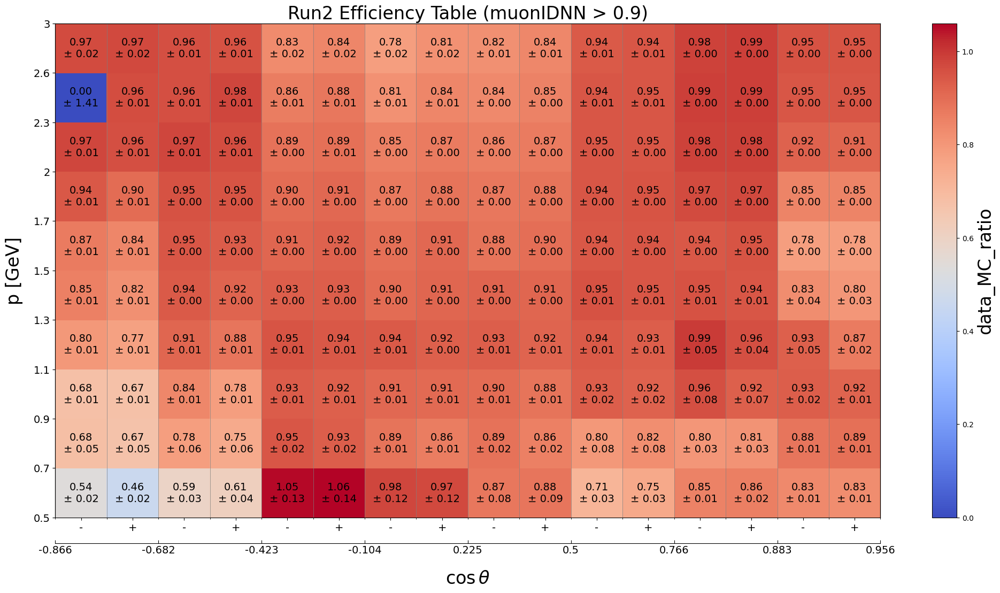

In [15]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_TwophotonMumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_efficiency_run2_TwophotonMumu.png',)

In [24]:
pi_mu_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_mu_fake_MC16rd_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_mu_fake = wm.produce_data_mc_ratio(**pi_mu_fake_ratio_cfg)
# pi_mu_fake.plot()
pi_mu_fake_table = pi_mu_fake.create_weights()
pi_mu_fake_table

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:04<01:07,  4.82s/it]

 13%|█████▊                                      | 2/15 [00:07<00:47,  3.63s/it]

 20%|████████▊                                   | 3/15 [00:12<00:48,  4.05s/it]

 27%|███████████▋                                | 4/15 [00:14<00:38,  3.51s/it]

 33%|██████████████▋                             | 5/15 [00:18<00:34,  3.46s/it]

 40%|█████████████████▌                          | 6/15 [00:36<01:17,  8.64s/it]

 47%|████████████████████▌                       | 7/15 [00:42<01:01,  7.66s/it]

 53%|███████████████████████▍                    | 8/15 [00:59<01:14, 10.60s/it]

 60%|██████████████████████████▍                 | 9/15 [01:04<00:54,  9.02s/it]

 67%|████████████████████████████▋              | 10/15 [01:13<00:44,  8.91s/it]

 73%|███████████████████████████████▌           | 11/15 [03:02<02:38, 39.65s/it]

 80%|██████████████████████████████████▍        | 12/15 [03:31<01:49, 36.34s/it]

 87%|█████████████████████████████████████▎     | 13/15 [05:11<01:51, 55.67s/it]

 93%|████████████████████████████████████████▏  | 14/15 [05:32<00:45, 45.14s/it]

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:13<03:11, 13.67s/it]

 13%|█████▊                                      | 2/15 [00:25<02:43, 12.54s/it]

 20%|████████▊                                   | 3/15 [00:31<01:55,  9.61s/it]

 27%|███████████▋                                | 4/15 [00:36<01:24,  7.69s/it]

 33%|██████████████▋                             | 5/15 [00:42<01:12,  7.27s/it]

 40%|█████████████████▌                          | 6/15 [01:24<02:49, 18.80s/it]

 47%|████████████████████▌                       | 7/15 [02:08<03:38, 27.27s/it]

 53%|███████████████████████▍                    | 8/15 [02:40<03:20, 28.58s/it]

 60%|██████████████████████████▍                 | 9/15 [03:01<02:38, 26.42s/it]

 67%|████████████████████████████▋              | 10/15 [03:19<01:59, 23.83s/it]

 73%|███████████████████████████████▌           | 11/15 [05:10<03:21, 50.31s/it]

 80%|██████████████████████████████████▍        | 12/15 [06:49<03:15, 65.16s/it]

 87%|█████████████████████████████████████▎     | 13/15 [07:32<01:57, 58.64s/it]

 93%|████████████████████████████████████████▏  | 14/15 [08:02<00:49, 49.72s/it]

100%|███████████████████████████████████████████| 15/15 [08:21<00:00, 33.46s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,0.7,-0.8660,-0.6820,-2,0,0.727930,0.049498,0.049498,0.016780,...,0.000107,0.000055,0.000055,0.003769,0.000114,0.000114,0.000112,0.000112,0.9,muonIDNN
1,0.5,0.7,-0.8660,-0.6820,0,2,0.778385,0.059831,0.059831,0.047134,...,0.000115,0.000125,0.000125,0.003020,0.000104,0.000104,0.000108,0.000108,0.9,muonIDNN
2,0.5,0.7,-0.6820,-0.4226,-2,0,0.621885,0.024452,0.024452,0.001977,...,0.000092,0.000023,0.000023,0.007731,0.000117,0.000117,0.000104,0.000104,0.9,muonIDNN
3,0.5,0.7,-0.6820,-0.4226,0,2,0.711576,0.022092,0.022092,0.001225,...,0.000106,0.000012,0.000012,0.008811,0.000125,0.000125,0.000124,0.000124,0.9,muonIDNN
4,0.5,0.7,-0.4226,-0.1045,-2,0,0.955052,0.012769,0.012769,0.000686,...,0.000131,0.000099,0.000099,0.015185,0.000137,0.000137,0.000281,0.000281,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.6,3.0,0.5000,0.7660,0,2,0.862931,0.052748,0.052748,0.066263,...,0.000472,0.000207,0.000207,0.011950,0.000314,0.000314,0.000638,0.000638,0.9,muonIDNN
156,2.6,3.0,0.7660,0.8829,-2,0,0.920837,0.056242,0.056242,0.060522,...,0.000533,0.000244,0.000244,0.012374,0.000386,0.000386,0.000227,0.000227,0.9,muonIDNN
157,2.6,3.0,0.7660,0.8829,0,2,1.013262,0.057681,0.057681,0.066471,...,0.000550,0.000339,0.000339,0.011512,0.000382,0.000382,0.000275,0.000275,0.9,muonIDNN
158,2.6,3.0,0.8829,0.9563,-2,0,1.033879,0.084764,0.084764,0.066495,...,0.000607,0.000150,0.000150,0.008680,0.000444,0.000444,0.000066,0.000066,0.9,muonIDNN


Number of p bins: 10, [0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


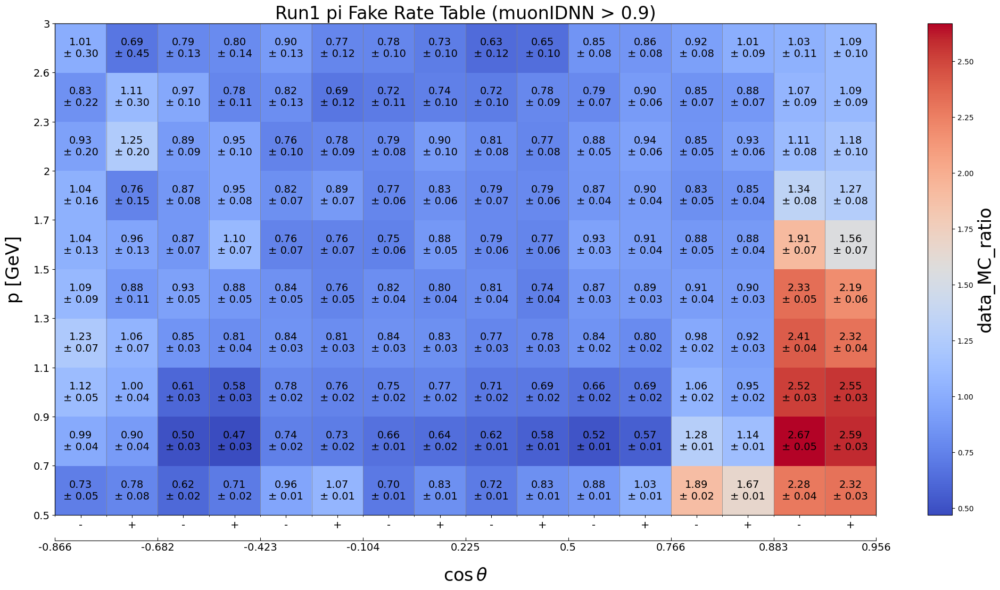

In [25]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run1.png',)

In [26]:
pi_mu_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_mu_fake_MC16rd_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_mu_fake = wm.produce_data_mc_ratio(**pi_mu_fake_ratio_cfg)
# pi_mu_fake.plot()
pi_mu_fake_table = pi_mu_fake.create_weights()
pi_mu_fake_table

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:02<00:11,  2.28s/it]

 33%|███████████████                              | 2/6 [00:06<00:14,  3.59s/it]

 50%|██████████████████████▌                      | 3/6 [00:10<00:10,  3.47s/it]

 67%|██████████████████████████████               | 4/6 [00:27<00:17,  8.88s/it]

 83%|█████████████████████████████████████▌       | 5/6 [00:47<00:12, 12.93s/it]

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:12<01:03, 12.72s/it]

 33%|███████████████                              | 2/6 [00:17<00:31,  7.88s/it]

 50%|██████████████████████▌                      | 3/6 [01:05<01:18, 26.21s/it]

 67%|██████████████████████████████               | 4/6 [01:13<00:38, 19.21s/it]

 83%|█████████████████████████████████████▌       | 5/6 [03:06<00:52, 52.99s/it]

100%|█████████████████████████████████████████████| 6/6 [03:15<00:00, 32.58s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,0.7,-0.8660,-0.6820,-2,0,0.471237,0.063227,0.063227,0.005132,...,0.000189,0.000027,0.000027,0.007592,0.000265,0.000265,0.000570,0.000570,0.9,muonIDNN
1,0.5,0.7,-0.8660,-0.6820,0,2,0.682845,0.076227,0.076227,0.003829,...,0.000190,0.000012,0.000012,0.004614,0.000216,0.000216,0.000133,0.000133,0.9,muonIDNN
2,0.5,0.7,-0.6820,-0.4226,-2,0,0.502317,0.037837,0.037837,0.049418,...,0.000138,0.000473,0.000473,0.009201,0.000213,0.000213,0.000036,0.000036,0.9,muonIDNN
3,0.5,0.7,-0.6820,-0.4226,0,2,0.623618,0.036243,0.036243,0.083459,...,0.000157,0.000791,0.000791,0.009150,0.000216,0.000216,0.000084,0.000084,0.9,muonIDNN
4,0.5,0.7,-0.4226,-0.1045,-2,0,1.045264,0.020067,0.020067,0.081306,...,0.000211,0.001399,0.001399,0.015304,0.000231,0.000231,0.000022,0.000022,0.9,muonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,2.6,3.0,0.5000,0.7660,0,2,0.904254,0.085244,0.085244,0.011015,...,0.000813,0.000374,0.000374,0.012302,0.000541,0.000541,0.000002,0.000002,0.9,muonIDNN
156,2.6,3.0,0.7660,0.8829,-2,0,0.858538,0.082130,0.082130,0.094788,...,0.000952,0.001771,0.001771,0.016259,0.000745,0.000745,0.000455,0.000455,0.9,muonIDNN
157,2.6,3.0,0.7660,0.8829,0,2,0.688959,0.086572,0.086572,0.072167,...,0.000937,0.001151,0.001151,0.018203,0.000797,0.000797,0.000391,0.000391,0.9,muonIDNN
158,2.6,3.0,0.8829,0.9563,-2,0,0.783771,0.145758,0.145758,0.089922,...,0.000945,0.001005,0.001005,0.010075,0.000839,0.000839,0.000045,0.000045,0.9,muonIDNN


Number of p bins: 10, [0.5, 0.7, 0.9, 1.1, 1.3, 1.5, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 8, [-0.866, -0.682, -0.4226, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


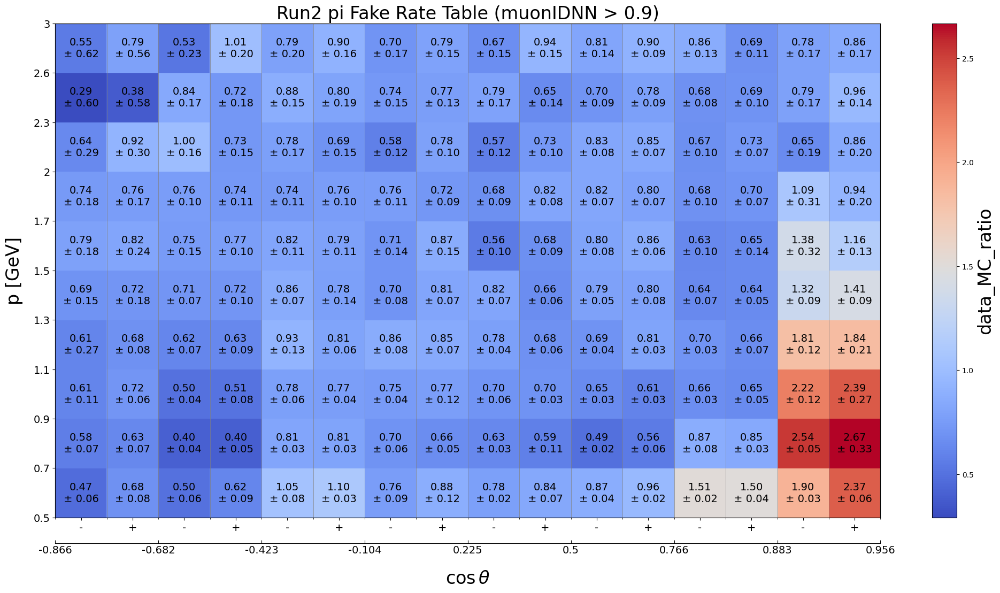

In [27]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_mu_fake_run2.png',)

In [91]:
K_mu_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 1, 1.5, 2, 2.5, 3],
                [-0.866, -0.4226, -0.1045, 0.225, 0.766, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/K_mu_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/K_mu_fake_MC16rd_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

K_mu_fake = wm.produce_data_mc_ratio(**K_mu_fake_ratio_cfg)
# K_mu_fake.plot()
K_mu_fake_table = K_mu_fake.create_weights()
K_mu_fake_table

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:04<00:17,  4.45s/it]

 40%|██████████████████                           | 2/5 [00:07<00:10,  3.42s/it]

 60%|███████████████████████████                  | 3/5 [00:11<00:07,  3.96s/it]

 80%|████████████████████████████████████         | 4/5 [00:14<00:03,  3.52s/it]

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:13<00:52, 13.09s/it]

 40%|██████████████████                           | 2/5 [00:24<00:35, 11.86s/it]

 60%|███████████████████████████                  | 3/5 [00:30<00:18,  9.31s/it]

 80%|████████████████████████████████████         | 4/5 [00:34<00:07,  7.35s/it]

100%|█████████████████████████████████████████████| 5/5 [00:40<00:00,  8.19s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,1.0,-0.8660,-0.4226,-2,0,1.038875,0.209332,0.209332,0.176890,...,0.000209,0.000042,0.000042,0.001082,0.000104,0.000104,0.000086,0.000086,0.9,muonIDNN
1,0.5,1.0,-0.8660,-0.4226,0,2,1.061568,0.210089,0.210089,0.098388,...,0.000241,0.000084,0.000084,0.001197,0.000108,0.000108,0.000031,0.000031,0.9,muonIDNN
2,0.5,1.0,-0.4226,-0.1045,-2,0,0.400885,0.695392,0.695392,0.470438,...,0.000224,0.000192,0.000192,0.000825,0.000129,0.000129,0.000173,0.000173,0.9,muonIDNN
3,0.5,1.0,-0.4226,-0.1045,0,2,1.180464,0.342666,0.342666,0.216150,...,0.000243,0.000147,0.000147,0.000712,0.000131,0.000131,0.000137,0.000137,0.9,muonIDNN
4,0.5,1.0,-0.1045,0.2250,-2,0,0.551148,0.377926,0.377926,0.180013,...,0.000247,0.000126,0.000126,0.001238,0.000134,0.000134,0.000221,0.000221,0.9,muonIDNN
5,0.5,1.0,-0.1045,0.2250,0,2,0.851709,0.270455,0.270455,0.344805,...,0.000241,0.000173,0.000173,0.001146,0.000126,0.000126,0.000269,0.000269,0.9,muonIDNN
6,0.5,1.0,0.2250,0.7660,-2,0,0.682349,0.299601,0.299601,0.443201,...,0.000173,0.000173,0.000173,0.000901,0.000094,0.000094,0.000086,0.000086,0.9,muonIDNN
7,0.5,1.0,0.2250,0.7660,0,2,0.259978,0.696630,0.696630,0.225685,...,0.000161,0.000137,0.000137,0.000898,0.000088,0.000088,0.000087,0.000087,0.9,muonIDNN
8,0.5,1.0,0.7660,0.9563,-2,0,0.819135,0.464652,0.464652,0.612511,...,0.000428,0.000331,0.000331,0.001184,0.000173,0.000173,0.000288,0.000288,0.9,muonIDNN
9,0.5,1.0,0.7660,0.9563,0,2,1.532818,0.366186,0.366186,0.603768,...,0.000441,0.000190,0.000190,0.000906,0.000165,0.000165,0.000054,0.000054,0.9,muonIDNN


Number of p bins: 5, [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
Number of cosTheta bins: 5, [-0.866, -0.4226, -0.1045, 0.225, 0.766, 0.9563]


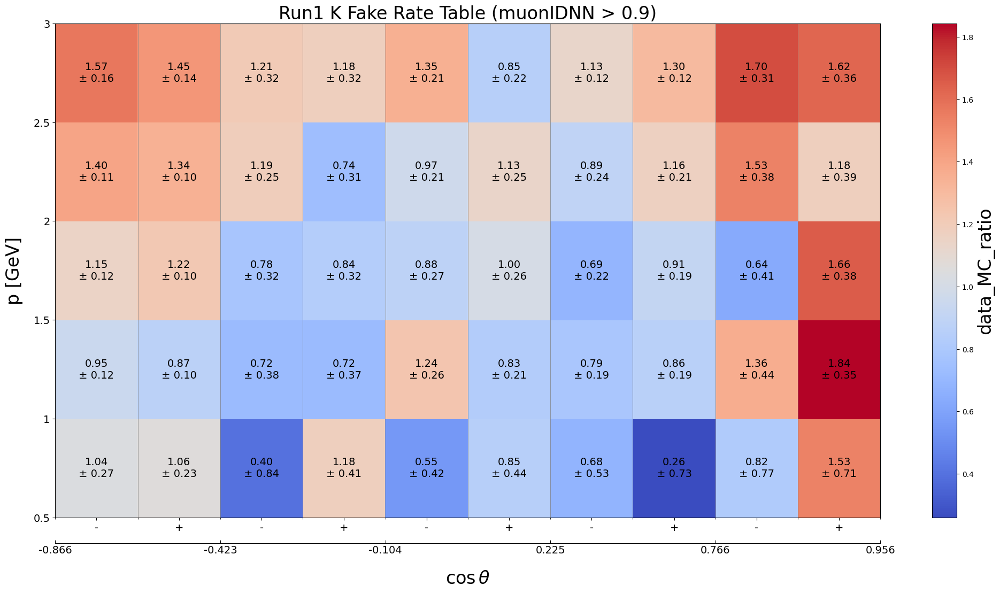

In [92]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_mu_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_mu_fake_run1.png',)

In [84]:
K_mu_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "muonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.5, 0.9, 1.5, 2, 2.5, 3],
                [-0.866, -0.4226, -0.1045, 0.225, 0.766, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/K_mu_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/K_mu_fake_MC16rd_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

K_mu_fake = wm.produce_data_mc_ratio(**K_mu_fake_ratio_cfg)
# K_mu_fake.plot()
K_mu_fake_table = K_mu_fake.create_weights()
K_mu_fake_table

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:00<00:00,  1.43it/s]

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:10<00:10, 10.65s/it]

100%|█████████████████████████████████████████████| 2/2 [00:12<00:00,  6.06s/it]
INFO: Number of excluded negative values: 1 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.5,0.9,-0.8660,-0.4226,-2,0,1.767697,0.475491,0.475491,0.039004,...,0.000456,0.000175,0.000175,0.000668,0.000185,0.000185,0.000320,0.000320,0.9,muonIDNN
1,0.5,0.9,-0.8660,-0.4226,0,2,2.274308,0.437935,0.437935,0.049966,...,0.000555,0.000200,0.000200,0.000689,0.000178,0.000178,0.000242,0.000242,0.9,muonIDNN
2,0.5,0.9,-0.4226,-0.1045,-2,0,2.905690,0.596505,0.596505,0.140220,...,0.000580,0.000370,0.000370,0.000526,0.000242,0.000242,0.000041,0.000041,0.9,muonIDNN
3,0.5,0.9,-0.4226,-0.1045,0,2,0.858155,0.961521,0.961521,0.148321,...,0.000521,0.000227,0.000227,0.000677,0.000237,0.000237,0.000239,0.000239,0.9,muonIDNN
4,0.5,0.9,-0.1045,0.2250,-2,0,1.765800,0.538494,0.538494,0.014724,...,0.000519,0.000227,0.000227,0.000734,0.000264,0.000264,0.000302,0.000302,0.9,muonIDNN
5,0.5,0.9,-0.1045,0.2250,0,2,1.082842,0.896174,0.896174,0.061103,...,0.000412,0.000156,0.000156,0.000488,0.000216,0.000216,0.000074,0.000074,0.9,muonIDNN
6,0.5,0.9,0.2250,0.7660,-2,0,2.061131,0.504580,0.504580,0.118808,...,0.000357,0.000277,0.000277,0.000481,0.000170,0.000170,0.000233,0.000233,0.9,muonIDNN
7,0.5,0.9,0.2250,0.7660,0,2,0.791433,0.958884,0.958884,0.158264,...,0.000321,0.000228,0.000228,0.000453,0.000154,0.000154,0.000107,0.000107,0.9,muonIDNN
8,0.5,0.9,0.7660,0.9563,-2,0,3.828532,0.670052,0.670052,0.254155,...,0.001112,0.000778,0.000778,0.000688,0.000358,0.000358,0.000889,0.000889,0.9,muonIDNN
9,0.5,0.9,0.7660,0.9563,0,2,0.000000,1.000000,1.000000,1.000000,...,0.000935,0.000790,0.000790,-0.000114,0.000329,0.000329,0.001606,0.001606,0.9,muonIDNN


Number of p bins: 5, [0.5, 0.9, 1.5, 2.0, 2.5, 3.0]
Number of cosTheta bins: 5, [-0.866, -0.4226, -0.1045, 0.225, 0.766, 0.9563]


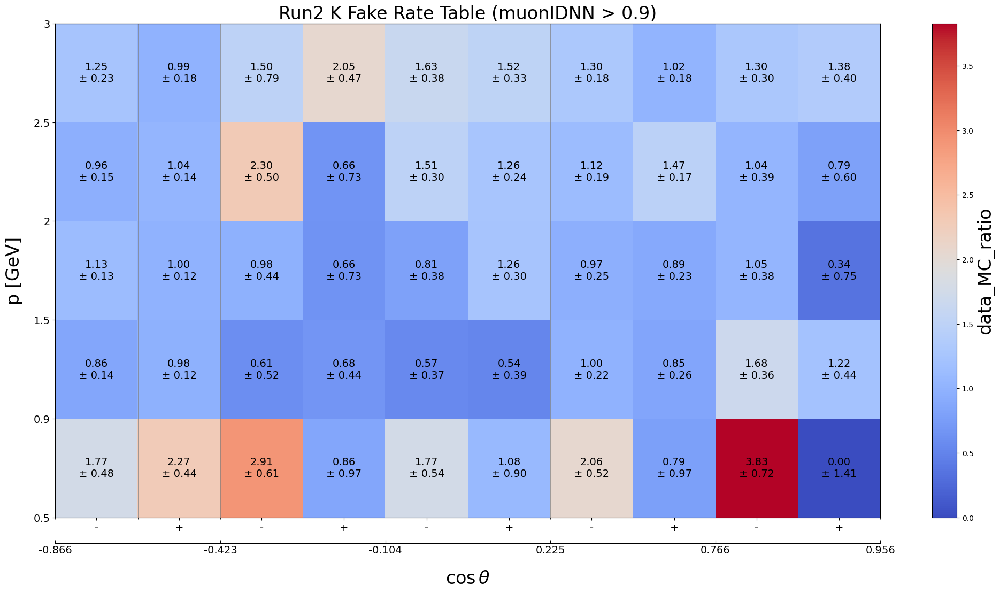

In [90]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'muonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_mu_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/K_mu_fake_run2.png',)

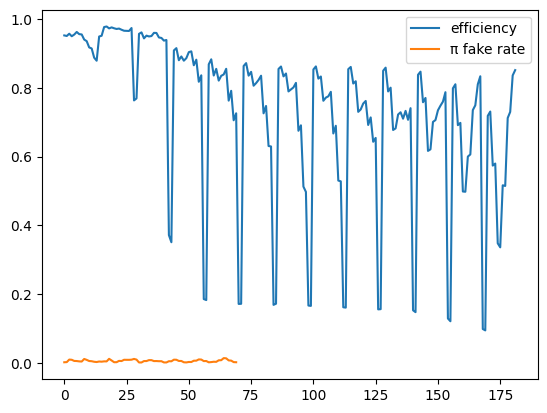

In [7]:
import pandas as pd
K_efficiency_run1 = pd.read_csv('../MC16_sys_tables/MC16_pid_tables/k_efficiency_run1.csv')
pi_k_fake = pd.read_csv('../MC16_sys_tables/MC16_pid_tables/pi_k_fake_run1.csv')
K_efficiency_run1.MC_efficiency.plot(label='efficiency')
pi_k_fake.MC_efficiency.plot(label='π fake rate')
plt.legend()

# KaonIDNN

In [32]:
k_ratio_cfg = {
    "particle_type": "K",
    "cut": "kaonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/k_efficiency_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/k_efficiency_MC16rd_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

k_efficiency = wm.produce_data_mc_ratio(**k_ratio_cfg)
# k_efficiency.plot()
k_efficiency_table = k_efficiency.create_weights()
k_efficiency_table

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:04<00:17,  4.49s/it]

 40%|██████████████████                           | 2/5 [00:06<00:09,  3.30s/it]

 60%|███████████████████████████                  | 3/5 [00:11<00:07,  3.80s/it]

 80%|████████████████████████████████████         | 4/5 [00:13<00:03,  3.19s/it]

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:17<01:09, 17.37s/it]

 40%|██████████████████                           | 2/5 [00:31<00:46, 15.65s/it]

 60%|███████████████████████████                  | 3/5 [00:40<00:24, 12.28s/it]

 80%|████████████████████████████████████         | 4/5 [00:45<00:09,  9.54s/it]

100%|█████████████████████████████████████████████| 5/5 [00:52<00:00, 10.47s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.4,-0.8660,-0.4230,-2,0,1.026734,0.008495,0.008495,0.066050,...,0.007682,0.036961,0.036961,0.952213,0.003075,0.003075,0.044479,0.044479,0.9,kaonIDNN
1,0.2,0.4,-0.8660,-0.4230,0,2,1.030138,0.008478,0.008478,0.069226,...,0.007677,0.038709,0.038709,0.950564,0.003068,0.003068,0.045074,0.045074,0.9,kaonIDNN
2,0.2,0.4,-0.4230,-0.1045,-2,0,1.035043,0.008972,0.008972,0.074671,...,0.008143,0.043368,0.043368,0.957149,0.003442,0.003442,0.041198,0.041198,0.9,kaonIDNN
3,0.2,0.4,-0.4230,-0.1045,0,2,1.026937,0.008842,0.008842,0.070041,...,0.007888,0.038338,0.038338,0.949819,0.003395,0.003395,0.048401,0.048401,0.9,kaonIDNN
4,0.2,0.4,-0.1045,0.2250,-2,0,1.050279,0.008951,0.008951,0.079546,...,0.008247,0.045278,0.045278,0.954686,0.003370,0.003370,0.044278,0.044278,0.9,kaonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,3.0,3.5,0.5000,0.7660,0,2,0.779345,0.007753,0.007753,0.004937,...,0.002895,0.002258,0.002258,0.514346,0.001449,0.001449,0.014455,0.014455,0.9,kaonIDNN
178,3.0,3.5,0.7660,0.8829,-2,0,0.850631,0.006766,0.006766,0.005891,...,0.003822,0.003348,0.003348,0.711975,0.001737,0.001737,0.020687,0.020687,0.9,kaonIDNN
179,3.0,3.5,0.7660,0.8829,0,2,0.832489,0.006522,0.006522,0.005727,...,0.003704,0.002974,0.002974,0.729825,0.001693,0.001693,0.021175,0.021175,0.9,kaonIDNN
180,3.0,3.5,0.8829,0.9563,-2,0,0.959687,0.006599,0.006599,0.011777,...,0.004891,0.006575,0.006575,0.835840,0.002110,0.002110,0.026487,0.026487,0.9,kaonIDNN


Number of p bins: 13, [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


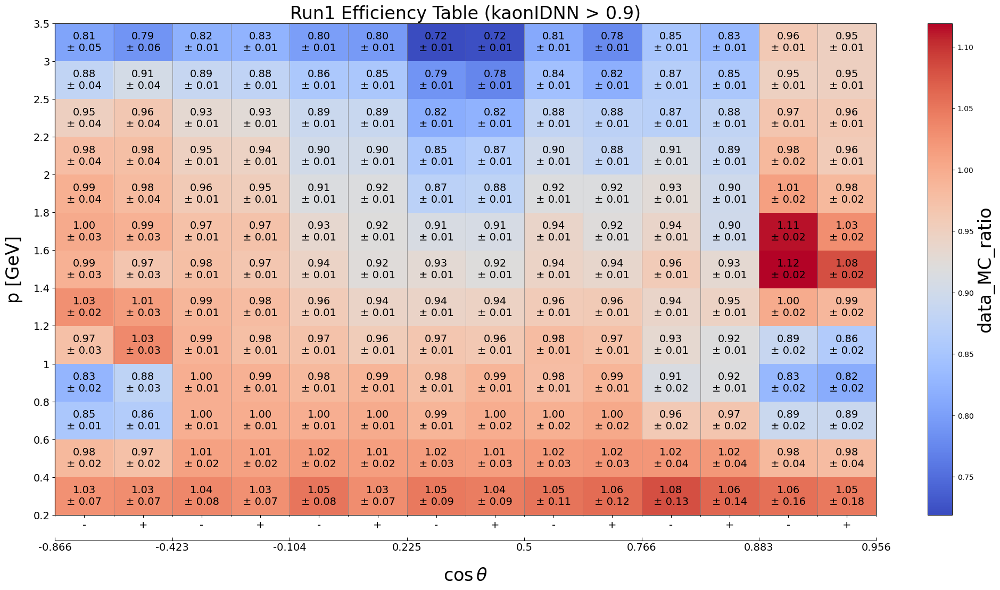

In [33]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_efficiency_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_efficiency_run1.png',)

In [34]:
k_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"], 
    "cut": "kaonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/k_efficiency_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/k_efficiency_MC16rd_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

k_efficiency = wm.produce_data_mc_ratio(**k_ratio_cfg)
# k_efficiency.plot()
k_efficiency_table = k_efficiency.create_weights()
k_efficiency_table

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:01<00:01,  1.76s/it]

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:16<00:16, 16.65s/it]

100%|█████████████████████████████████████████████| 2/2 [00:21<00:00, 10.72s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.4,-0.8660,-0.4230,-2,0,0.970559,0.014204,0.014204,0.034732,...,0.012804,0.054924,0.054924,0.999082,0.005230,0.005230,0.002092,0.002092,0.9,kaonIDNN
1,0.2,0.4,-0.8660,-0.4230,0,2,0.989732,0.014066,0.014066,0.029717,...,0.012892,0.050645,0.050645,0.998864,0.005266,0.005266,0.003702,0.003702,0.9,kaonIDNN
2,0.2,0.4,-0.4230,-0.1045,-2,0,1.004552,0.015026,0.015026,0.035316,...,0.013819,0.058531,0.058531,0.993679,0.005805,0.005805,0.004714,0.004714,0.9,kaonIDNN
3,0.2,0.4,-0.4230,-0.1045,0,2,0.982713,0.014919,0.014919,0.036150,...,0.013661,0.060711,0.060711,1.011827,0.005884,0.005884,0.013358,0.013358,0.9,kaonIDNN
4,0.2,0.4,-0.1045,0.2250,-2,0,1.003118,0.014859,0.014859,0.038434,...,0.013831,0.064600,0.064600,1.009882,0.005920,0.005920,0.011742,0.011742,0.9,kaonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177,3.0,3.5,0.5000,0.7660,0,2,0.761753,0.012162,0.012162,0.001795,...,0.004804,0.001888,0.001888,0.553753,0.002363,0.002363,0.018365,0.018365,0.9,kaonIDNN
178,3.0,3.5,0.7660,0.8829,-2,0,0.841046,0.010861,0.010861,0.002050,...,0.006203,0.002982,0.002982,0.726126,0.002791,0.002791,0.023155,0.023155,0.9,kaonIDNN
179,3.0,3.5,0.7660,0.8829,0,2,0.818755,0.010643,0.010643,0.002801,...,0.006087,0.003481,0.003481,0.743502,0.002709,0.002709,0.023690,0.023690,0.9,kaonIDNN
180,3.0,3.5,0.8829,0.9563,-2,0,0.916375,0.012183,0.012183,0.004856,...,0.008502,0.007255,0.007255,0.818267,0.003645,0.003645,0.034941,0.034941,0.9,kaonIDNN


Number of p bins: 13, [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


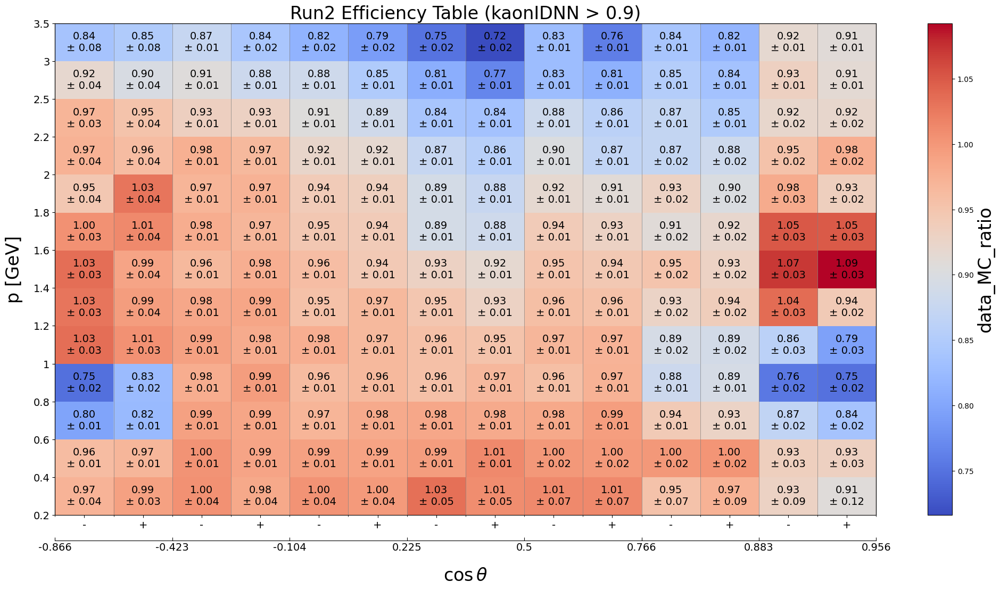

In [35]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_efficiency_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_efficiency_run2.png',)

In [99]:
pi_k_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "kaonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 1.1, 1.4, 1.7, 2, 2.4, 3],
                [-0.866, -0.423, 0.225, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_k_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_k_fake_MC16rd_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_k_fake = wm.produce_data_mc_ratio(**pi_k_fake_ratio_cfg)
# pi_k_fake.plot()
pi_k_fake_table = pi_k_fake.create_weights()
pi_k_fake_table

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:05<01:10,  5.03s/it]

 13%|█████▊                                      | 2/15 [00:07<00:47,  3.62s/it]

 20%|████████▊                                   | 3/15 [00:12<00:48,  4.05s/it]

 27%|███████████▋                                | 4/15 [00:14<00:38,  3.46s/it]

 33%|██████████████▋                             | 5/15 [00:18<00:35,  3.54s/it]

 40%|█████████████████▌                          | 6/15 [00:38<01:20,  9.00s/it]

 47%|████████████████████▌                       | 7/15 [00:43<01:03,  7.95s/it]

 53%|███████████████████████▍                    | 8/15 [01:01<01:16, 10.93s/it]

 60%|██████████████████████████▍                 | 9/15 [01:06<00:55,  9.22s/it]

 67%|████████████████████████████▋              | 10/15 [01:15<00:45,  9.02s/it]

 73%|███████████████████████████████▌           | 11/15 [03:05<02:40, 40.05s/it]

 80%|██████████████████████████████████▍        | 12/15 [03:34<01:50, 36.68s/it]

 87%|█████████████████████████████████████▎     | 13/15 [05:17<01:53, 56.75s/it]

 93%|████████████████████████████████████████▏  | 14/15 [05:37<00:45, 45.76s/it]

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:13<03:15, 13.93s/it]

 13%|█████▊                                      | 2/15 [00:25<02:42, 12.52s/it]

 20%|████████▊                                   | 3/15 [00:31<01:55,  9.62s/it]

 27%|███████████▋                                | 4/15 [00:36<01:24,  7.71s/it]

 33%|██████████████▋                             | 5/15 [00:43<01:15,  7.56s/it]

 40%|█████████████████▌                          | 6/15 [01:24<02:50, 18.92s/it]

 47%|████████████████████▌                       | 7/15 [02:09<03:40, 27.51s/it]

 53%|███████████████████████▍                    | 8/15 [02:41<03:21, 28.79s/it]

 60%|██████████████████████████▍                 | 9/15 [03:03<02:39, 26.64s/it]

 67%|████████████████████████████▋              | 10/15 [03:22<02:01, 24.25s/it]

 73%|███████████████████████████████▌           | 11/15 [05:21<03:33, 53.25s/it]

 80%|██████████████████████████████████▍        | 12/15 [07:09<03:30, 70.08s/it]

 87%|█████████████████████████████████████▎     | 13/15 [07:56<02:06, 63.07s/it]

 93%|████████████████████████████████████████▏  | 14/15 [08:26<00:53, 53.14s/it]

100%|███████████████████████████████████████████| 15/15 [08:48<00:00, 35.26s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.8660,-0.4230,-2,0,3.116955,0.045781,0.045781,0.733497,...,0.000087,0.001288,0.001288,0.001592,0.000067,0.000067,0.004945,0.004945,0.9,kaonIDNN
1,0.2,0.5,-0.8660,-0.4230,0,2,2.488615,0.039811,0.039811,0.463363,...,0.000090,0.001408,0.001408,0.002022,0.000072,0.000072,0.005319,0.005319,0.9,kaonIDNN
2,0.2,0.5,-0.4230,0.2250,-2,0,1.727334,0.007402,0.007402,0.075863,...,0.000073,0.001332,0.001332,0.009411,0.000056,0.000056,0.010340,0.010340,0.9,kaonIDNN
3,0.2,0.5,-0.4230,0.2250,0,2,1.641092,0.008025,0.008025,0.075267,...,0.000071,0.001295,0.001295,0.008793,0.000056,0.000056,0.009667,0.009667,0.9,kaonIDNN
4,0.2,0.5,0.2250,0.7660,-2,0,1.570158,0.009758,0.009758,0.083846,...,0.000052,0.000817,0.000817,0.005448,0.000041,0.000041,0.006801,0.006801,0.9,kaonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,2.4,3.0,0.2250,0.7660,0,2,0.802798,0.036079,0.036079,0.092969,...,0.000329,0.000348,0.000348,0.013003,0.000229,0.000229,0.000700,0.000700,0.9,kaonIDNN
66,2.4,3.0,0.7660,0.8829,-2,0,1.259136,0.063154,0.063154,0.176841,...,0.000415,0.000207,0.000207,0.007028,0.000297,0.000297,0.000697,0.000697,0.9,kaonIDNN
67,2.4,3.0,0.7660,0.8829,0,2,1.289714,0.068526,0.068526,0.212825,...,0.000408,0.000286,0.000286,0.006347,0.000298,0.000298,0.000102,0.000102,0.9,kaonIDNN
68,2.4,3.0,0.8829,0.9563,-2,0,0.654476,0.366618,0.366618,0.900023,...,0.000424,0.000379,0.000379,0.002007,0.000349,0.000349,0.000077,0.000077,0.9,kaonIDNN


Number of p bins: 7, [0.2, 0.5, 1.1, 1.4, 1.7, 2.0, 2.4, 3.0]
Number of cosTheta bins: 5, [-0.866, -0.423, 0.225, 0.766, 0.8829, 0.9563]


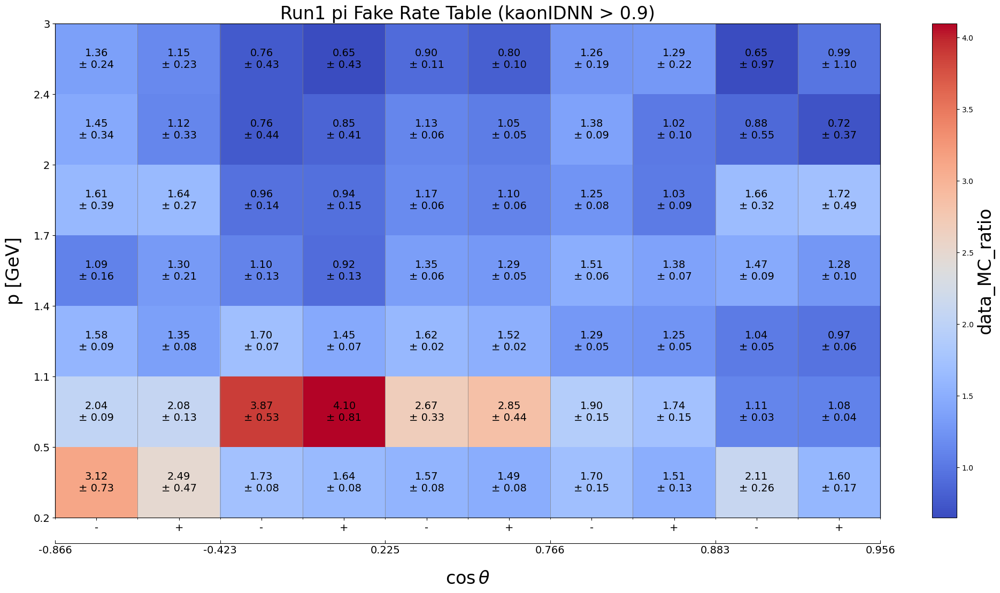

In [100]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_k_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_k_fake_run1.png',)

In [101]:
pi_k_fake_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "kaonIDNN > 0.9",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 1.1, 1.4, 1.7, 2, 2.4, 3],
                [-0.866, -0.423, 0.225, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_k_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_k_fake_MC16rd_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_k_fake = wm.produce_data_mc_ratio(**pi_k_fake_ratio_cfg)
# pi_k_fake.plot()
pi_k_fake_table = pi_k_fake.create_weights()
pi_k_fake_table

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:02<00:10,  2.18s/it]

 33%|███████████████                              | 2/6 [00:06<00:14,  3.62s/it]

 50%|██████████████████████▌                      | 3/6 [00:10<00:10,  3.45s/it]

 67%|██████████████████████████████               | 4/6 [00:28<00:18,  9.18s/it]

 83%|█████████████████████████████████████▌       | 5/6 [00:48<00:13, 13.16s/it]

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:12<01:04, 12.80s/it]

 33%|███████████████                              | 2/6 [00:17<00:31,  7.88s/it]

 50%|██████████████████████▌                      | 3/6 [01:07<01:22, 27.41s/it]

 67%|██████████████████████████████               | 4/6 [01:16<00:40, 20.02s/it]

 83%|█████████████████████████████████████▌       | 5/6 [03:15<00:55, 55.53s/it]

100%|█████████████████████████████████████████████| 6/6 [03:24<00:00, 34.05s/it]
INFO: Number of excluded negative values: 1 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.8660,-0.4230,-2,0,3.373348,0.126035,0.126035,0.807816,...,0.000132,0.001570,0.001570,0.000996,0.000119,0.000119,0.004863,0.004863,0.9,kaonIDNN
1,0.2,0.5,-0.8660,-0.4230,0,2,2.334620,0.100368,0.100368,0.375033,...,0.000136,0.001489,0.001489,0.001393,0.000127,0.000127,0.005150,0.005150,0.9,kaonIDNN
2,0.2,0.5,-0.4230,0.2250,-2,0,1.734163,0.015877,0.015877,0.312346,...,0.000106,0.000693,0.000693,0.007013,0.000093,0.000093,0.009530,0.009530,0.9,kaonIDNN
3,0.2,0.5,-0.4230,0.2250,0,2,1.536826,0.017167,0.017167,0.252482,...,0.000104,0.000307,0.000307,0.006732,0.000094,0.000094,0.008763,0.008763,0.9,kaonIDNN
4,0.2,0.5,0.2250,0.7660,-2,0,1.593723,0.021601,0.021601,0.281795,...,0.000080,0.000137,0.000137,0.004020,0.000071,0.000071,0.006087,0.006087,0.9,kaonIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65,2.4,3.0,0.2250,0.7660,0,2,0.879360,0.062710,0.062710,0.064865,...,0.000519,0.001314,0.001314,0.011107,0.000369,0.000369,0.000234,0.000234,0.9,kaonIDNN
66,2.4,3.0,0.7660,0.8829,-2,0,1.534603,0.117825,0.117825,0.048550,...,0.000679,0.000984,0.000984,0.005497,0.000473,0.000473,0.000611,0.000611,0.9,kaonIDNN
67,2.4,3.0,0.7660,0.8829,0,2,1.239737,0.135009,0.135009,0.048724,...,0.000620,0.000287,0.000287,0.005171,0.000487,0.000487,0.000844,0.000844,0.9,kaonIDNN
68,2.4,3.0,0.8829,0.9563,-2,0,2.097449,0.849556,0.849556,0.395853,...,0.000734,0.000603,0.000603,0.000784,0.000567,0.000567,0.001076,0.001076,0.9,kaonIDNN


Number of p bins: 7, [0.2, 0.5, 1.1, 1.4, 1.7, 2.0, 2.4, 3.0]
Number of cosTheta bins: 5, [-0.866, -0.423, 0.225, 0.766, 0.8829, 0.9563]


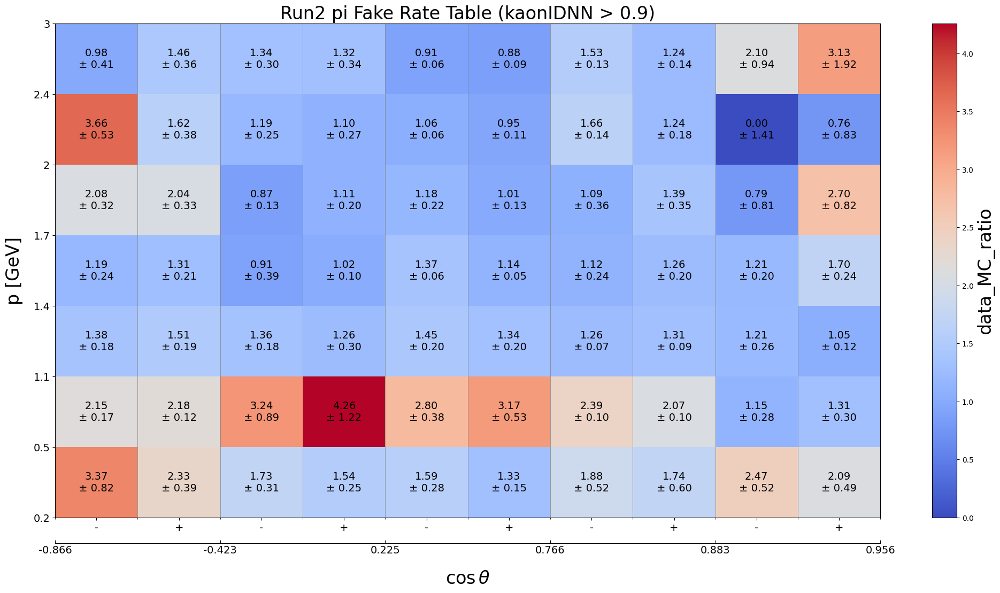

In [102]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_k_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_k_fake_run2.png',)

In [15]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "kaonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 0.7, 1.1, 1.5, 3.5],
                [-0.866, -0.423, 0, 0.33, 0.66, 0.956],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_k_fake_run1_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run1_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

 13%|█████▊                                      | 4/30 [00:42<02:40,  6.16s/it]

 53%|██████████████████████▉                    | 16/30 [03:43<01:25,  6.12s/it]

 90%|██████████████████████████████████████▋    | 27/30 [06:25<00:14,  4.97s/it]

 93%|████████████████████████████████████████▏  | 28/30 [06:26<00:07,  3.52s/it]

100%|█████████████████████████████████████████████| 5/5 [05:21<00:00, 64.22s/it]
INFO: Number of excluded negative values: 5 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,0.7,-0.866,-0.423,-2,0,1.604725,0.006303,0.006303,0.002546,...,0.000032,0.0,0.0,0.004891,0.000024,0.000024,0.0,0.0,0.9,kaonIDNN
1,0.3,0.7,-0.866,-0.423,0,2,1.502148,0.006457,0.006457,0.003378,...,0.000030,0.0,0.0,0.004764,0.000023,0.000023,0.0,0.0,0.9,kaonIDNN
2,0.3,0.7,-0.423,0.000,-2,0,2.561402,0.012506,0.012506,0.023475,...,0.000013,0.0,0.0,0.000702,0.000007,0.000007,0.0,0.0,0.9,kaonIDNN
3,0.3,0.7,-0.423,0.000,0,2,2.328188,0.014627,0.014627,0.034087,...,0.000011,0.0,0.0,0.000529,0.000006,0.000006,0.0,0.0,0.9,kaonIDNN
4,0.3,0.7,0.000,0.330,-2,0,1.650401,0.012985,0.012985,0.015396,...,0.000014,0.0,0.0,0.000974,0.000010,0.000010,0.0,0.0,0.9,kaonIDNN
5,0.3,0.7,0.000,0.330,0,2,1.526674,0.015007,0.015007,0.023274,...,0.000012,0.0,0.0,0.000761,0.000008,0.000008,0.0,0.0,0.9,kaonIDNN
6,0.3,0.7,0.330,0.660,-2,0,2.290917,0.009378,0.009378,0.022178,...,0.000014,0.0,0.0,0.001128,0.000009,0.000009,0.0,0.0,0.9,kaonIDNN
7,0.3,0.7,0.330,0.660,0,2,1.992042,0.010792,0.010792,0.034103,...,0.000012,0.0,0.0,0.000899,0.000007,0.000007,0.0,0.0,0.9,kaonIDNN
8,0.3,0.7,0.660,0.956,-2,0,3.107238,0.006266,0.006266,0.015325,...,0.000031,0.0,0.0,0.003162,0.000017,0.000017,0.0,0.0,0.9,kaonIDNN
9,0.3,0.7,0.660,0.956,0,2,2.444133,0.006699,0.006699,0.023432,...,0.000028,0.0,0.0,0.003010,0.000017,0.000017,0.0,0.0,0.9,kaonIDNN


Number of p bins: 4, [0.3, 0.7, 1.1, 1.5, 3.5]
Number of cosTheta bins: 5, [-0.866, -0.423, 0.0, 0.33, 0.66, 0.956]


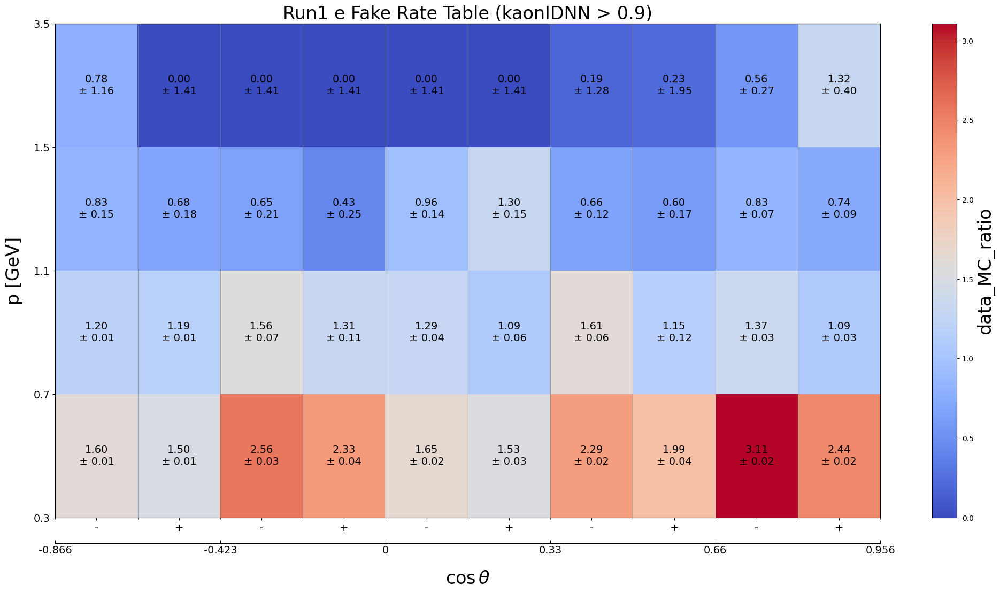

In [4]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_k_fake_run1_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_k_fake_run1_TwophotonEe.png',)

In [17]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "kaonIDNN > 0.9",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.3, 0.7, 1.1, 1.5, 3.5],
                [-0.866, -0.423, 0, 0.33, 0.66, 0.956],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_k_fake_run2_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run1_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

 25%|███████████                                 | 3/12 [00:20<00:46,  5.19s/it]

 33%|██████████████▋                             | 4/12 [00:20<00:25,  3.19s/it]

 83%|███████████████████████████████████▊       | 10/12 [02:47<00:30, 15.16s/it]

100%|█████████████████████████████████████████████| 2/2 [01:17<00:00, 38.58s/it]
INFO: Number of excluded negative values: 1 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.3,0.7,-0.866,-0.423,-2,0,1.468494,0.013081,0.013081,0.012084,...,0.000056,0.0,0.0,0.003714,0.000030,0.000030,0.0,0.0,0.9,kaonIDNN
1,0.3,0.7,-0.866,-0.423,0,2,1.292399,0.013255,0.013255,0.014093,...,0.000054,0.0,0.0,0.003931,0.000031,0.000031,0.0,0.0,0.9,kaonIDNN
2,0.3,0.7,-0.423,0.000,-2,0,2.119797,0.024679,0.024679,0.077983,...,0.000023,0.0,0.0,0.000605,0.000010,0.000010,0.0,0.0,0.9,kaonIDNN
3,0.3,0.7,-0.423,0.000,0,2,1.756076,0.029629,0.029629,0.111803,...,0.000020,0.0,0.0,0.000488,0.000009,0.000009,0.0,0.0,0.9,kaonIDNN
4,0.3,0.7,0.000,0.330,-2,0,1.933161,0.023675,0.023675,0.053890,...,0.000028,0.0,0.0,0.000839,0.000013,0.000013,0.0,0.0,0.9,kaonIDNN
5,0.3,0.7,0.000,0.330,0,2,1.901596,0.026941,0.026941,0.075928,...,0.000026,0.0,0.0,0.000664,0.000012,0.000012,0.0,0.0,0.9,kaonIDNN
6,0.3,0.7,0.330,0.660,-2,0,2.112012,0.017426,0.017426,0.074544,...,0.000029,0.0,0.0,0.001049,0.000012,0.000012,0.0,0.0,0.9,kaonIDNN
7,0.3,0.7,0.330,0.660,0,2,1.630488,0.020816,0.020816,0.108477,...,0.000025,0.0,0.0,0.000907,0.000011,0.000011,0.0,0.0,0.9,kaonIDNN
8,0.3,0.7,0.660,0.956,-2,0,1.669719,0.013224,0.013224,0.048652,...,0.000047,0.0,0.0,0.002796,0.000024,0.000024,0.0,0.0,0.9,kaonIDNN
9,0.3,0.7,0.660,0.956,0,2,1.176776,0.014857,0.014857,0.063798,...,0.000043,0.0,0.0,0.002939,0.000024,0.000024,0.0,0.0,0.9,kaonIDNN


Number of p bins: 4, [0.3, 0.7, 1.1, 1.5, 3.5]
Number of cosTheta bins: 5, [-0.866, -0.423, 0.0, 0.33, 0.66, 0.956]


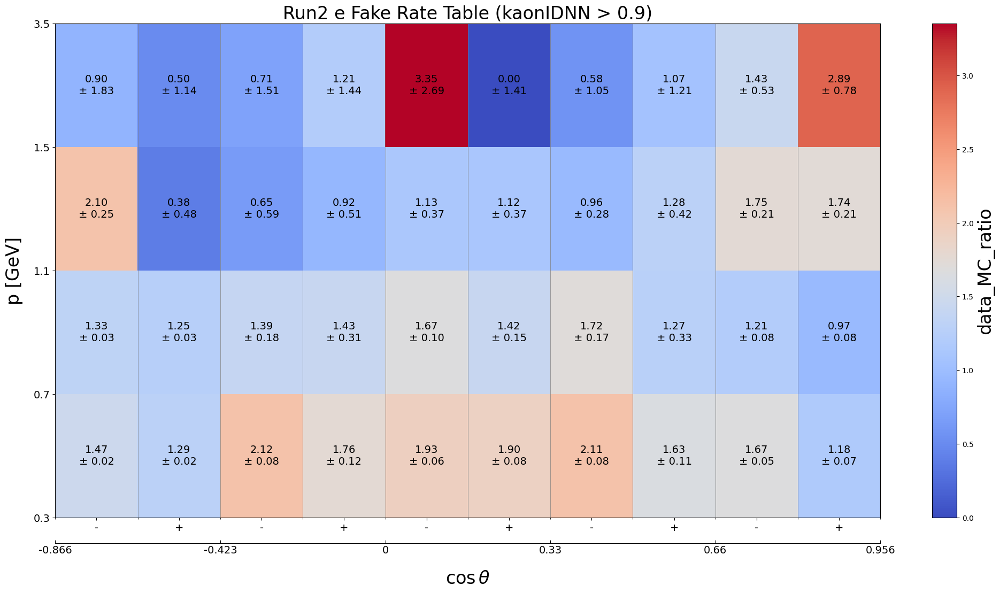

In [5]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'kaonIDNN',
    threshold = 0.9,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_k_fake_run2_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_k_fake_run2_TwophotonEe.png',)

# pionIDNN

In [40]:
pi_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"], 
    "cut": "pionIDNN > 0.1",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_efficiency_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_efficiency_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_efficiency = wm.produce_data_mc_ratio(**pi_ratio_cfg)
# pi_efficiency.plot()
pi_efficiency_table = pi_efficiency.create_weights()
pi_efficiency_table

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:05<01:23,  5.99s/it]

 13%|█████▊                                      | 2/15 [00:08<00:54,  4.17s/it]

 20%|████████▊                                   | 3/15 [00:14<00:56,  4.71s/it]

 27%|███████████▋                                | 4/15 [00:17<00:43,  3.94s/it]

 33%|██████████████▋                             | 5/15 [00:20<00:38,  3.90s/it]

 40%|█████████████████▌                          | 6/15 [00:44<01:34, 10.54s/it]

 47%|████████████████████▌                       | 7/15 [00:50<01:14,  9.29s/it]

 53%|███████████████████████▍                    | 8/15 [01:12<01:31, 13.12s/it]

 60%|██████████████████████████▍                 | 9/15 [01:18<01:05, 10.98s/it]

 67%|████████████████████████████▋              | 10/15 [01:28<00:53, 10.67s/it]

 73%|███████████████████████████████▌           | 11/15 [04:15<03:54, 58.55s/it]

 80%|██████████████████████████████████▍        | 12/15 [04:59<02:42, 54.10s/it]

 87%|█████████████████████████████████████▎     | 13/15 [07:29<02:46, 83.10s/it]

 93%|████████████████████████████████████████▏  | 14/15 [08:00<01:07, 67.30s/it]

  0%|                                                    | 0/15 [00:00<?, ?it/s]

  7%|██▉                                         | 1/15 [00:22<05:19, 22.81s/it]

 13%|█████▊                                      | 2/15 [00:41<04:25, 20.39s/it]

 20%|████████▊                                   | 3/15 [00:51<03:05, 15.45s/it]

 27%|███████████▋                                | 4/15 [00:58<02:14, 12.21s/it]

 33%|██████████████▋                             | 5/15 [01:07<01:52, 11.26s/it]

 40%|█████████████████▌                          | 6/15 [02:05<04:04, 27.18s/it]

 47%|████████████████████▌                       | 7/15 [03:09<05:12, 39.11s/it]

 53%|███████████████████████▍                    | 8/15 [03:55<04:48, 41.27s/it]

 60%|██████████████████████████▍                 | 9/15 [04:26<03:49, 38.17s/it]

 67%|████████████████████████████▋              | 10/15 [04:53<02:52, 34.56s/it]

 73%|███████████████████████████████▌           | 11/15 [07:55<05:18, 79.75s/it]

 80%|█████████████████████████████████▌        | 12/15 [10:40<05:16, 105.65s/it]

 87%|█████████████████████████████████████▎     | 13/15 [11:51<03:10, 95.28s/it]

 93%|████████████████████████████████████████▏  | 14/15 [12:39<01:20, 80.85s/it]

100%|███████████████████████████████████████████| 15/15 [13:11<00:00, 52.77s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.0,0.2,-0.8660,-0.4230,-2,0,0.970154,0.000708,0.000708,0.004230,...,0.000534,0.012427,0.012427,0.950926,0.000388,0.000388,0.097688,0.097688,0.1,pionIDNN
1,0.0,0.2,-0.8660,-0.4230,0,2,0.976924,0.000696,0.000696,0.003449,...,0.000516,0.011889,0.011889,0.948211,0.000396,0.000396,0.103619,0.103619,0.1,pionIDNN
2,0.0,0.2,-0.4230,-0.1045,-2,0,0.975462,0.000573,0.000573,0.000666,...,0.000411,0.004468,0.004468,0.923701,0.000320,0.000320,0.050286,0.050286,0.1,pionIDNN
3,0.0,0.2,-0.4230,-0.1045,0,2,0.982411,0.000524,0.000524,0.000501,...,0.000374,0.004151,0.004151,0.932316,0.000306,0.000306,0.048727,0.048727,0.1,pionIDNN
4,0.0,0.2,-0.1045,0.2250,-2,0,0.932955,0.000842,0.000842,0.000824,...,0.000553,0.005135,0.005135,0.864538,0.000422,0.000422,0.098881,0.098881,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,3.0,3.5,0.5000,0.7660,0,2,1.004649,0.001600,0.001600,0.004713,...,0.001324,0.002105,0.002105,0.954303,0.000771,0.000771,0.000996,0.000996,0.1,pionIDNN
192,3.0,3.5,0.7660,0.8829,-2,0,0.993208,0.001794,0.001794,0.005850,...,0.001478,0.002251,0.002251,0.961380,0.000871,0.000871,0.003285,0.003285,0.1,pionIDNN
193,3.0,3.5,0.7660,0.8829,0,2,0.993737,0.001859,0.001859,0.007009,...,0.001532,0.002812,0.002812,0.960627,0.000901,0.000901,0.002777,0.002777,0.1,pionIDNN
194,3.0,3.5,0.8829,0.9563,-2,0,1.000066,0.002570,0.002570,0.010622,...,0.002148,0.005110,0.005110,0.965841,0.001243,0.001243,0.001999,0.001999,0.1,pionIDNN


Number of p bins: 14, [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


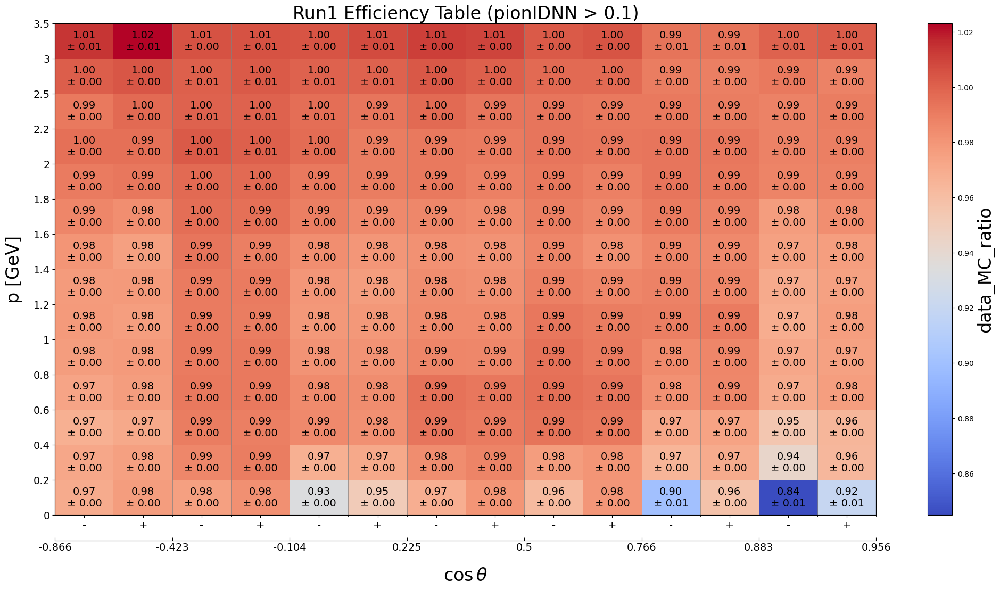

In [41]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_efficiency_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_efficiency_run1.png',)

In [42]:
pi_ratio_cfg = {
    "particle_type": "pi",
    # "model_names": ["TwophotonEe"], 
    "cut": "pionIDNN > 0.1",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0, 0.2, 0.4, 0.6, 0.8, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/pi_efficiency_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/pi_efficiency_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

pi_efficiency = wm.produce_data_mc_ratio(**pi_ratio_cfg)
# pi_efficiency.plot()
pi_efficiency_table = pi_efficiency.create_weights()
pi_efficiency_table

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:02<00:14,  2.85s/it]

 33%|███████████████                              | 2/6 [00:09<00:20,  5.03s/it]

 50%|██████████████████████▌                      | 3/6 [00:13<00:13,  4.54s/it]

 67%|██████████████████████████████               | 4/6 [00:37<00:24, 12.25s/it]

 83%|█████████████████████████████████████▌       | 5/6 [01:09<00:19, 19.25s/it]

  0%|                                                     | 0/6 [00:00<?, ?it/s]

 17%|███████▌                                     | 1/6 [00:20<01:42, 20.42s/it]

 33%|███████████████                              | 2/6 [00:25<00:46, 11.58s/it]

 50%|██████████████████████▌                      | 3/6 [01:32<01:50, 36.74s/it]

 67%|██████████████████████████████               | 4/6 [01:43<00:53, 26.59s/it]

 83%|█████████████████████████████████████▌       | 5/6 [04:53<01:25, 85.35s/it]

100%|█████████████████████████████████████████████| 6/6 [05:07<00:00, 51.21s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.0,0.2,-0.8660,-0.4230,-2,0,0.975462,0.001153,0.001153,0.006333,...,0.000869,0.001120,0.001120,0.963522,0.000664,0.000664,0.092643,0.092643,0.1,pionIDNN
1,0.0,0.2,-0.8660,-0.4230,0,2,0.984890,0.001119,0.001119,0.004860,...,0.000822,0.002667,0.002667,0.960218,0.000677,0.000677,0.096206,0.096206,0.1,pionIDNN
2,0.0,0.2,-0.4230,-0.1045,-2,0,0.973451,0.000980,0.000980,0.016264,...,0.000717,0.011890,0.011890,0.936831,0.000547,0.000547,0.049068,0.049068,0.1,pionIDNN
3,0.0,0.2,-0.4230,-0.1045,0,2,0.989044,0.000851,0.000851,0.014444,...,0.000605,0.010373,0.010373,0.944777,0.000522,0.000522,0.046334,0.046334,0.1,pionIDNN
4,0.0,0.2,-0.1045,0.2250,-2,0,0.932377,0.001484,0.001484,0.030958,...,0.001008,0.022052,0.022052,0.880002,0.000733,0.000733,0.095098,0.095098,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191,3.0,3.5,0.5000,0.7660,0,2,1.002428,0.002533,0.002533,0.000517,...,0.002099,0.001458,0.001458,0.961156,0.001241,0.001241,0.003718,0.003718,0.1,pionIDNN
192,3.0,3.5,0.7660,0.8829,-2,0,0.991660,0.003018,0.003018,0.004082,...,0.002466,0.006199,0.006199,0.961921,0.001497,0.001497,0.004022,0.004022,0.1,pionIDNN
193,3.0,3.5,0.7660,0.8829,0,2,0.995122,0.003142,0.003142,0.000526,...,0.002540,0.003120,0.003120,0.958222,0.001596,0.001596,0.003896,0.003896,0.1,pionIDNN
194,3.0,3.5,0.8829,0.9563,-2,0,0.987114,0.004373,0.004373,0.000683,...,0.003614,0.002772,0.002772,0.970559,0.002146,0.002146,0.006106,0.006106,0.1,pionIDNN


Number of p bins: 14, [0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


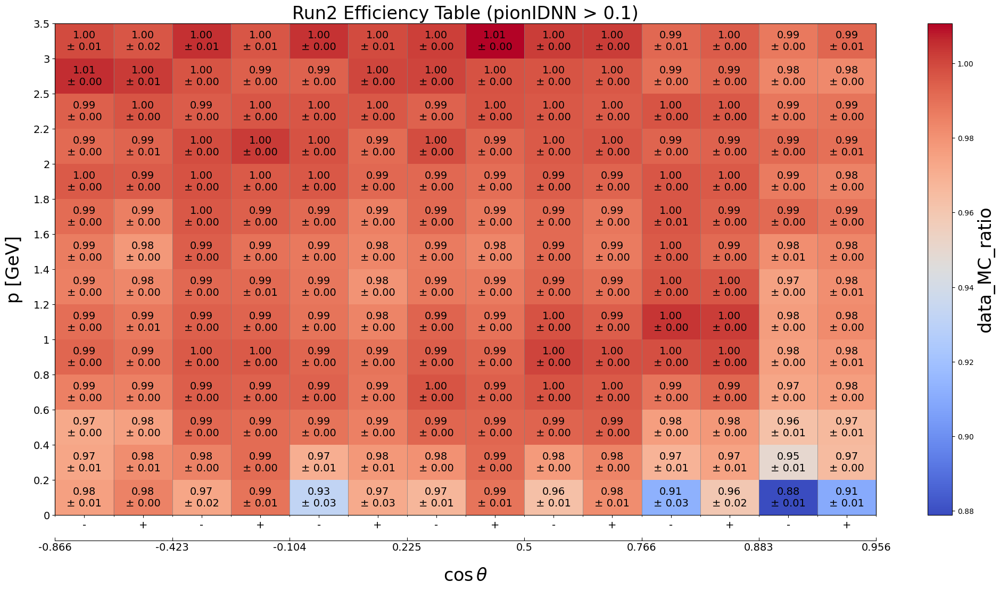

In [43]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_efficiency_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/pi_efficiency_run2.png',)

In [58]:
k_pi_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0, 0.6, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/k_pi_fake_run1.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/k_pi_fake_run1.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

k_pi_fake = wm.produce_data_mc_ratio(**k_pi_fake_ratio_cfg)
# k_pi_fake.plot()
k_pi_fake_table = k_pi_fake.create_weights()
k_pi_fake_table

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:04<00:19,  4.83s/it]

 40%|██████████████████                           | 2/5 [00:07<00:10,  3.59s/it]

 60%|███████████████████████████                  | 3/5 [00:12<00:08,  4.13s/it]

 80%|████████████████████████████████████         | 4/5 [00:15<00:03,  3.59s/it]

  0%|                                                     | 0/5 [00:00<?, ?it/s]

 20%|█████████                                    | 1/5 [00:15<01:02, 15.70s/it]

 40%|██████████████████                           | 2/5 [00:28<00:42, 14.22s/it]

 60%|███████████████████████████                  | 3/5 [00:36<00:21, 10.98s/it]

 80%|████████████████████████████████████         | 4/5 [00:41<00:08,  8.65s/it]

100%|█████████████████████████████████████████████| 5/5 [00:47<00:00,  9.57s/it]
INFO: Number of excluded negative values: 5 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.0,0.6,-0.8660,-0.4230,-2,0,0.236421,0.474395,0.474395,1.708058,...,0.003341,0.018228,0.018228,0.029947,0.001462,0.001462,0.028584,0.028584,0.1,pionIDNN
1,0.0,0.6,-0.8660,-0.4230,0,2,0.350419,0.356926,0.356926,2.325555,...,0.003370,0.019780,0.019780,0.027255,0.001471,0.001471,0.025913,0.025913,0.1,pionIDNN
2,0.0,0.6,-0.4230,-0.1045,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.003924,0.025356,0.025356,0.028503,0.001733,0.001733,0.028059,0.028059,0.1,pionIDNN
3,0.0,0.6,-0.4230,-0.1045,0,2,0.188864,0.687639,0.687639,2.237202,...,0.003796,0.022812,0.022812,0.029333,0.001713,0.001713,0.028778,0.028778,0.1,pionIDNN
4,0.0,0.6,-0.1045,0.2250,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.003814,0.024305,0.024305,0.030101,0.001676,0.001676,0.029358,0.029358,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,3.0,3.5,0.5000,0.7660,0,2,1.147077,0.008599,0.008599,0.005039,...,0.002944,0.002075,0.002075,0.340090,0.001402,0.001402,0.015266,0.015266,0.1,pionIDNN
150,3.0,3.5,0.7660,0.8829,-2,0,1.309460,0.017015,0.017015,0.018956,...,0.003416,0.003070,0.003070,0.177712,0.001530,0.001530,0.020408,0.020408,0.1,pionIDNN
151,3.0,3.5,0.7660,0.8829,0,2,1.417097,0.016730,0.016730,0.015638,...,0.003313,0.002065,0.002065,0.165544,0.001485,0.001485,0.020194,0.020194,0.1,pionIDNN
152,3.0,3.5,0.8829,0.9563,-2,0,1.102776,0.048019,0.048019,0.100264,...,0.003954,0.005010,0.005010,0.082911,0.001731,0.001731,0.023672,0.023672,0.1,pionIDNN


Number of p bins: 11, [0.0, 0.6, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


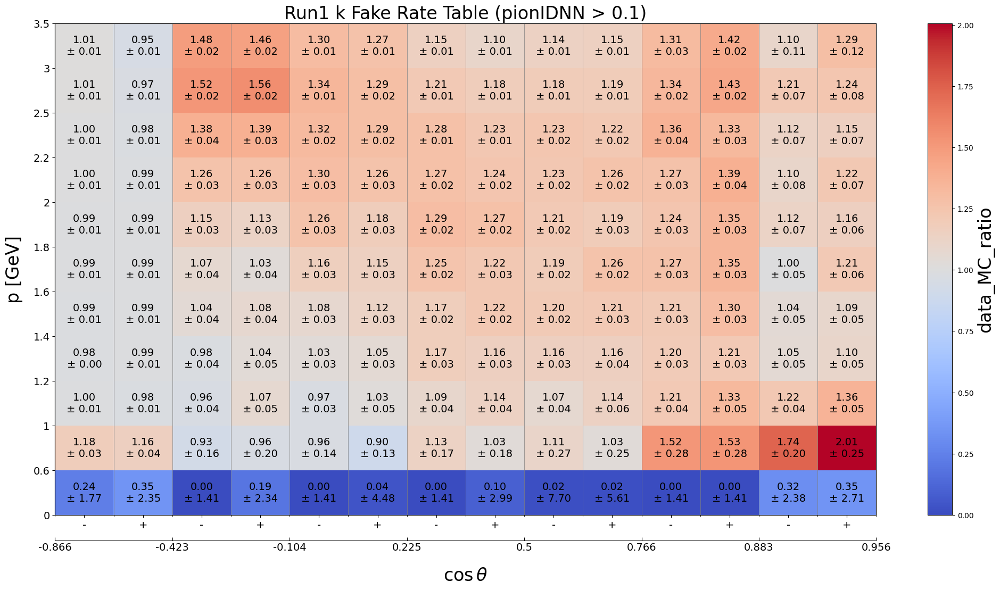

In [59]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_pi_fake_run1.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_pi_fake_run1.png',)

In [60]:
k_pi_fake_ratio_cfg = {
    "particle_type": "K",
    # "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    "apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0, 0.6, 1, 1.2, 1.4, 1.6, 1.8, 2, 2.2, 2.5, 3, 3.5],
                [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]",
    "output": "../MC16_sys_tables/MC16_pid_tables/k_pi_fake_run2.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/k_pi_fake_run2.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

k_pi_fake = wm.produce_data_mc_ratio(**k_pi_fake_ratio_cfg)
# k_pi_fake.plot()
k_pi_fake_table = k_pi_fake.create_weights()
k_pi_fake_table

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:02<00:02,  2.03s/it]

  0%|                                                     | 0/2 [00:00<?, ?it/s]

 50%|██████████████████████▌                      | 1/2 [00:14<00:14, 14.61s/it]

100%|█████████████████████████████████████████████| 2/2 [00:19<00:00,  9.70s/it]
INFO: Number of excluded negative values: 13 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.0,0.6,-0.8660,-0.4230,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.005641,0.030779,0.030779,-0.002460,0.002444,0.002444,0.003398,0.003398,0.1,pionIDNN
1,0.0,0.6,-0.8660,-0.4230,0,2,0.000000,1.000000,1.000000,1.000000,...,0.005698,0.027775,0.027775,-0.002702,0.002449,0.002449,0.003712,0.003712,0.1,pionIDNN
2,0.0,0.6,-0.4230,-0.1045,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.006480,0.035259,0.035259,-0.000441,0.002854,0.002854,0.001017,0.001017,0.1,pionIDNN
3,0.0,0.6,-0.4230,-0.1045,0,2,0.000000,1.000000,1.000000,1.000000,...,0.006461,0.033766,0.033766,-0.005493,0.002834,0.002834,0.005891,0.005891,0.1,pionIDNN
4,0.0,0.6,-0.1045,0.2250,-2,0,0.000000,1.000000,1.000000,1.000000,...,0.006115,0.033389,0.033389,-0.002492,0.002803,0.002803,0.003172,0.003172,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149,3.0,3.5,0.5000,0.7660,0,2,1.277171,0.014477,0.014477,0.001202,...,0.004824,0.001281,0.001281,0.302890,0.002227,0.002227,0.017043,0.017043,0.1,pionIDNN
150,3.0,3.5,0.7660,0.8829,-2,0,1.372954,0.029136,0.029136,0.003702,...,0.005432,0.002256,0.002256,0.158517,0.002382,0.002382,0.020276,0.020276,0.1,pionIDNN
151,3.0,3.5,0.7660,0.8829,0,2,1.548929,0.028847,0.028847,0.003813,...,0.005358,0.002415,0.002415,0.143605,0.002279,0.002279,0.021570,0.021570,0.1,pionIDNN
152,3.0,3.5,0.8829,0.9563,-2,0,1.407221,0.065707,0.065707,0.023101,...,0.006977,0.006029,0.006029,0.087696,0.002936,0.002936,0.030309,0.030309,0.1,pionIDNN


Number of p bins: 11, [0.0, 0.6, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.5, 3.0, 3.5]
Number of cosTheta bins: 7, [-0.866, -0.423, -0.1045, 0.225, 0.5, 0.766, 0.8829, 0.9563]


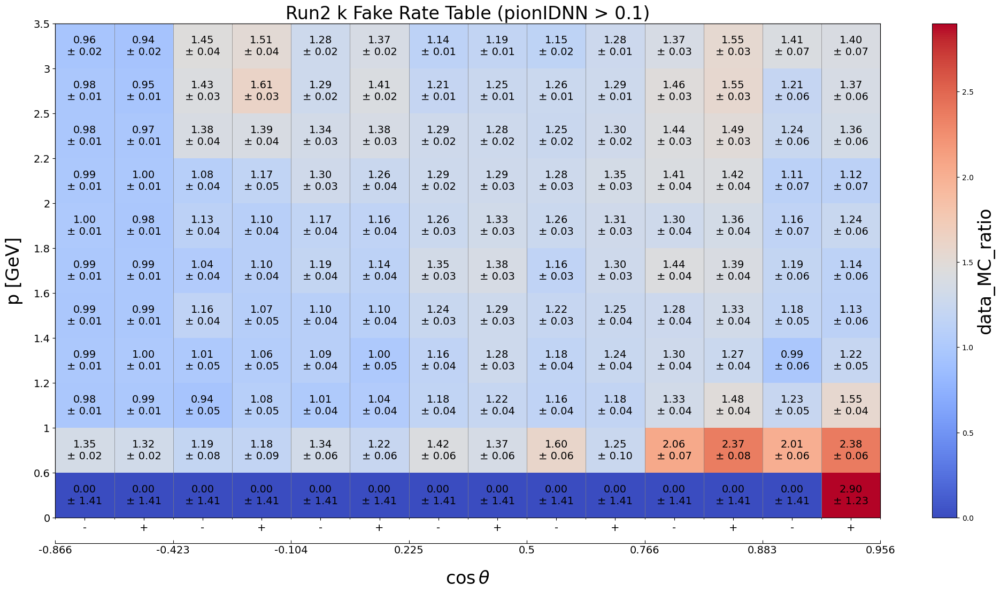

In [61]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_pi_fake_run2.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/k_pi_fake_run2.png',)

In [60]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["TwophotonMumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 0.8, 1.1, 1.4, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.55, -0.25, 0, 0.25, 0.5, 0.75, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run1_TwophotonMumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_TwophotonMumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

 10%|████▍                                       | 3/30 [03:32<24:21, 54.12s/it]

 30%|█████████████▏                              | 9/30 [03:50<02:35,  7.42s/it]

 50%|█████████████████████▌                     | 15/30 [04:52<02:33, 10.21s/it]

 70%|██████████████████████████████             | 21/30 [05:47<01:32, 10.31s/it]

 90%|██████████████████████████████████████▋    | 27/30 [09:36<01:57, 39.22s/it]

100%|█████████████████████████████████████████████| 5/5 [05:47<00:00, 69.43s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.866,-0.5500,-2,0,0.980737,0.000370,0.000370,0.000171,...,0.000306,0.0,0.0,0.976042,0.000182,0.000182,0.0,0.0,0.1,pionIDNN
1,0.2,0.5,-0.866,-0.5500,0,2,0.983811,0.000312,0.000312,0.000121,...,0.000255,0.0,0.0,0.980404,0.000163,0.000163,0.0,0.0,0.1,pionIDNN
2,0.2,0.5,-0.550,-0.2500,-2,0,1.323020,0.000941,0.000941,0.023879,...,0.000346,0.0,0.0,0.393309,0.000261,0.000261,0.0,0.0,0.1,pionIDNN
3,0.2,0.5,-0.550,-0.2500,0,2,1.323520,0.000938,0.000938,0.025990,...,0.000337,0.0,0.0,0.381353,0.000252,0.000252,0.0,0.0,0.1,pionIDNN
4,0.2,0.5,-0.250,0.0000,-2,0,1.346092,0.001651,0.001651,0.080114,...,0.000410,0.0,0.0,0.241525,0.000258,0.000258,0.0,0.0,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,2.6,3.0,0.250,0.5000,0,2,3.691409,0.033959,0.033959,0.168643,...,0.002929,0.0,0.0,0.042298,0.001197,0.001197,0.0,0.0,0.1,pionIDNN
122,2.6,3.0,0.500,0.7500,-2,0,1.485212,0.020144,0.020144,0.031239,...,0.001374,0.0,0.0,0.063471,0.000882,0.000882,0.0,0.0,0.1,pionIDNN
123,2.6,3.0,0.500,0.7500,0,2,1.335081,0.019091,0.019091,0.028296,...,0.001397,0.0,0.0,0.073698,0.000941,0.000941,0.0,0.0,0.1,pionIDNN
124,2.6,3.0,0.750,0.9563,-2,0,0.959471,0.010561,0.010561,0.014934,...,0.000667,0.0,0.0,0.088891,0.000631,0.000631,0.0,0.0,0.1,pionIDNN


Number of p bins: 9, [0.2, 0.5, 0.8, 1.1, 1.4, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 7, [-0.866, -0.55, -0.25, 0.0, 0.25, 0.5, 0.75, 0.9563]


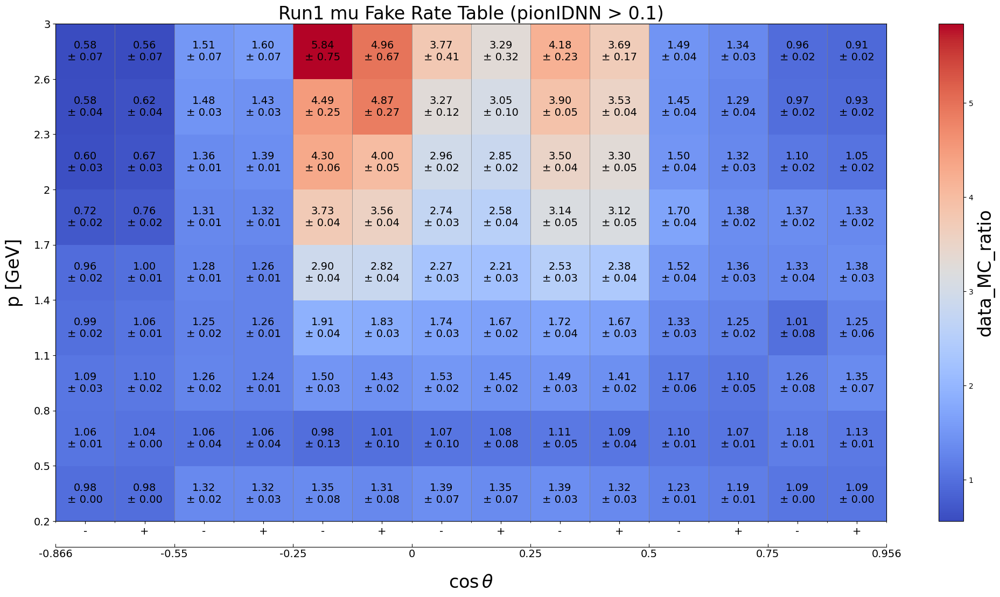

In [61]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run1_TwophotonMumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run1_TwophotonMumu.png',)

In [62]:
mu_ratio_cfg = {
    "particle_type": "mu",
    "model_names": ["TwophotonMumu"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 0.8, 1.1, 1.4, 1.7, 2, 2.3, 2.6, 3],
                [-0.866, -0.55, -0.25, 0, 0.25, 0.5, 0.75, 0.9563],
                [-2, 0, 2]],
    "precut": "abs(dz)<2 and dr<0.5 and nCDCHits>0 and nSVDHits>0", #thetaInCDCAcceptance and 
    "output": "../MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run2_TwophotonMumu.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/mu_efficiency_MC16rd_TwophotonMumu.png"
}

os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

mu_efficiency = wm.produce_data_mc_ratio(**mu_ratio_cfg)
# mu_efficiency.plot()
mu_efficiency_table = mu_efficiency.create_weights()
mu_efficiency_table

 25%|███████████                                 | 3/12 [03:47<08:41, 57.93s/it]

 75%|█████████████████████████████████           | 9/12 [04:20<00:30, 10.30s/it]

100%|█████████████████████████████████████████████| 2/2 [01:23<00:00, 41.59s/it]


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.866,-0.5500,-2,0,0.989859,0.000515,0.000515,0.000081,...,0.000437,0.0,0.0,0.978373,0.000242,0.000242,0.0,0.0,0.1,pionIDNN
1,0.2,0.5,-0.866,-0.5500,0,2,0.992988,0.000442,0.000442,0.000079,...,0.000378,0.0,0.0,0.983187,0.000211,0.000211,0.0,0.0,0.1,pionIDNN
2,0.2,0.5,-0.550,-0.2500,-2,0,1.361283,0.001578,0.001578,0.026270,...,0.000661,0.0,0.0,0.391624,0.000383,0.000383,0.0,0.0,0.1,pionIDNN
3,0.2,0.5,-0.550,-0.2500,0,2,1.375994,0.001647,0.001647,0.031843,...,0.000667,0.0,0.0,0.369161,0.000367,0.000367,0.0,0.0,0.1,pionIDNN
4,0.2,0.5,-0.250,0.0000,-2,0,1.371503,0.002932,0.002932,0.096539,...,0.000765,0.0,0.0,0.228088,0.000369,0.000369,0.0,0.0,0.1,pionIDNN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121,2.6,3.0,0.250,0.5000,0,2,4.142411,0.049820,0.049820,0.246951,...,0.004417,0.0,0.0,0.043069,0.001862,0.001862,0.0,0.0,0.1,pionIDNN
122,2.6,3.0,0.500,0.7500,-2,0,2.290368,0.034864,0.034864,0.031594,...,0.001987,0.0,0.0,0.040442,0.001112,0.001112,0.0,0.0,0.1,pionIDNN
123,2.6,3.0,0.500,0.7500,0,2,2.110935,0.034672,0.034672,0.030957,...,0.001959,0.0,0.0,0.042133,0.001128,0.001128,0.0,0.0,0.1,pionIDNN
124,2.6,3.0,0.750,0.9563,-2,0,1.326223,0.017616,0.017616,0.020598,...,0.000866,0.0,0.0,0.055081,0.000717,0.000717,0.0,0.0,0.1,pionIDNN


Number of p bins: 9, [0.2, 0.5, 0.8, 1.1, 1.4, 1.7, 2.0, 2.3, 2.6, 3.0]
Number of cosTheta bins: 7, [-0.866, -0.55, -0.25, 0.0, 0.25, 0.5, 0.75, 0.9563]


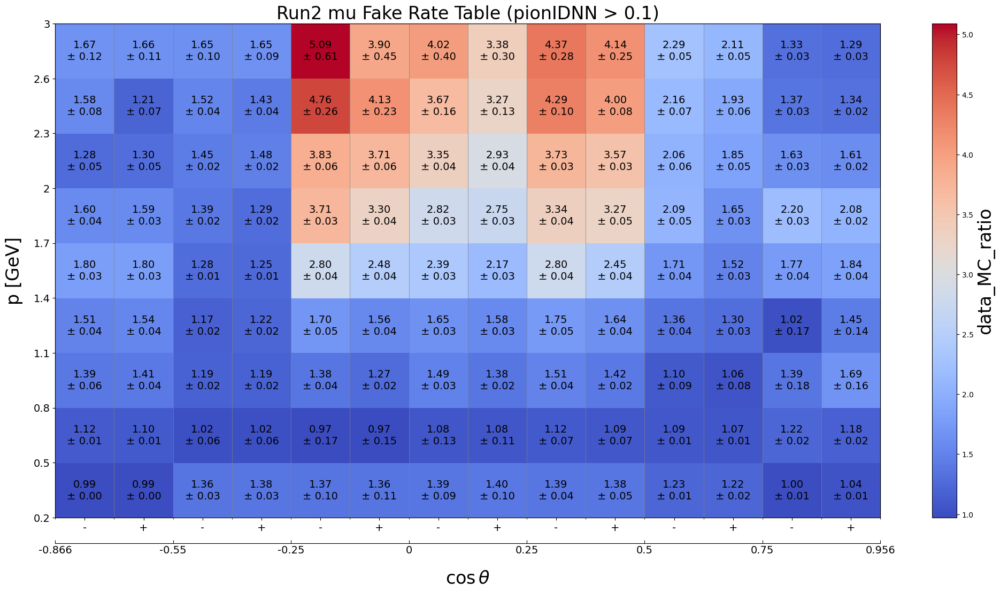

In [63]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run2_TwophotonMumu.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/mu_pi_fake_run2_TwophotonMumu.png',)

In [76]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['proc16_chunk1','proc16_chunk2','proc16_chunk3','proc16_chunk4','proc16_offres'],
    'mc_query': ['MC16rd_p16_chunk1','MC16rd_p16_chunk2','MC16rd_p16_chunk3','MC16rd_p16_chunk4','MC16rd_p16_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 1, 2, 3],
                [-0.866, -0.423, 0, 0.5, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_pi_fake_run1_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run1_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

100%|█████████████████████████████████████████████| 5/5 [04:58<00:00, 59.60s/it]
INFO: Number of excluded negative values: 2 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.866,-0.4230,-2,0,1.329759,0.002748,0.002748,0.005504,...,0.000170,0.0,0.0,0.068478,0.000138,0.000138,0.0,0.0,0.1,pionIDNN
1,0.2,0.5,-0.866,-0.4230,0,2,1.446965,0.002535,0.002535,0.004937,...,0.000183,0.0,0.0,0.075309,0.000143,0.000143,0.0,0.0,0.1,pionIDNN
2,0.2,0.5,-0.423,0.0000,-2,0,1.319485,0.005252,0.005252,0.060671,...,0.000061,0.0,0.0,0.011745,0.000041,0.000041,0.0,0.0,0.1,pionIDNN
3,0.2,0.5,-0.423,0.0000,0,2,1.296228,0.004523,0.004523,0.047336,...,0.000066,0.0,0.0,0.014949,0.000045,0.000045,0.0,0.0,0.1,pionIDNN
4,0.2,0.5,0.000,0.5000,-2,0,1.547662,0.004176,0.004176,0.051973,...,0.000057,0.0,0.0,0.012586,0.000037,0.000037,0.0,0.0,0.1,pionIDNN
5,0.2,0.5,0.000,0.5000,0,2,1.386208,0.003688,0.003688,0.040578,...,0.000061,0.0,0.0,0.016325,0.000041,0.000041,0.0,0.0,0.1,pionIDNN
6,0.2,0.5,0.500,0.9563,-2,0,1.228488,0.003770,0.003770,0.015467,...,0.000091,0.0,0.0,0.027621,0.000073,0.000073,0.0,0.0,0.1,pionIDNN
7,0.2,0.5,0.500,0.9563,0,2,1.273449,0.003546,0.003546,0.014555,...,0.000094,0.0,0.0,0.029365,0.000073,0.000073,0.0,0.0,0.1,pionIDNN
8,0.5,1.0,-0.866,-0.4230,-2,0,1.016080,0.002788,0.002788,0.033377,...,0.000078,0.0,0.0,0.035812,0.000064,0.000064,0.0,0.0,0.1,pionIDNN
9,0.5,1.0,-0.866,-0.4230,0,2,1.010720,0.002465,0.002465,0.025312,...,0.000082,0.0,0.0,0.043426,0.000070,0.000070,0.0,0.0,0.1,pionIDNN


Number of p bins: 4, [0.2, 0.5, 1.0, 2.0, 3.0]
Number of cosTheta bins: 4, [-0.866, -0.423, 0.0, 0.5, 0.9563]


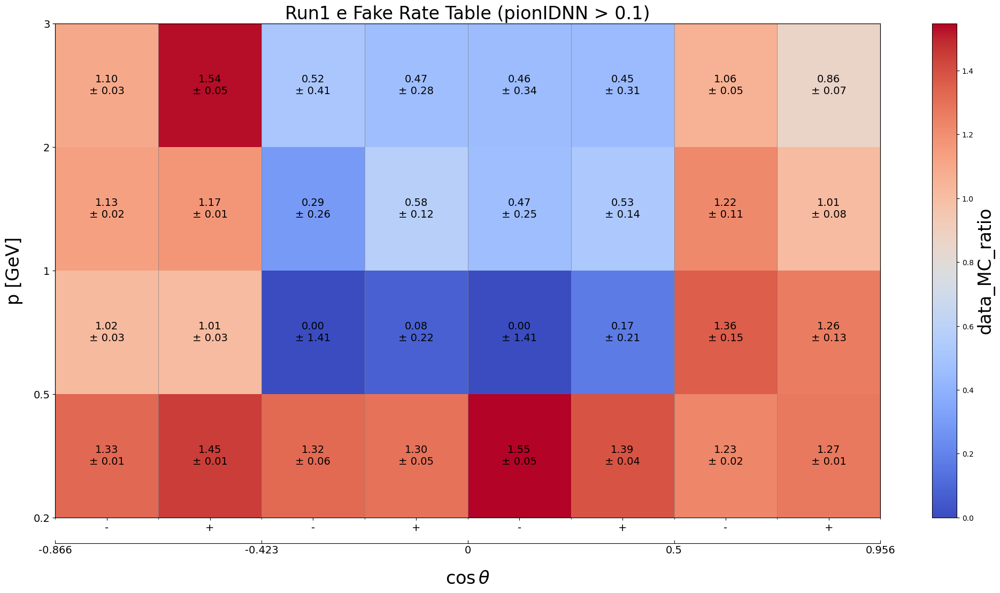

In [77]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_pi_fake_run1_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_pi_fake_run1_TwophotonEe.png',)

In [78]:
e_ratio_cfg = {
    "particle_type": "e",
    "model_names": ["TwophotonEe"],  # or Jpsiee, but if I remove this line, then I get an error 
    "cut": "pionIDNN > 0.1",
    #"apply_std_constraints": False,
    # "data_collection": "proc16+prompt",
    # "mc_collection": "MC16rd_proc16+prompt",
    'data_query': ['prompt16','prompt16_offres'],
    'mc_query': ['MC16rd_prompt','MC16rd_prompt_offres'],
    "track_variables": ["p", "cosTheta", "charge"],
    "binning":  [[0.2, 0.5, 1, 2, 3],
                [-0.866, -0.423, 0, 0.5, 0.9563],
                [-2, 0, 2]],
    "precut": "[abs(dz)<2] and [dr<0.5] and [nCDCHits>0] and [nSVDHits>0]", #and [thetaInCDCAcceptance]
    "output": "../MC16_sys_tables/MC16_pid_tables/e_pi_fake_run2_TwophotonEe.csv",
    # "save_plots": "../MC16_sys_tables/MC16_pid_tables/e_efficiency_MC16rd_run1_TwophotonEe.png"
}
os.makedirs('../MC16_sys_tables/MC16_pid_tables/', exist_ok=True)

e_efficiency = wm.produce_data_mc_ratio(**e_ratio_cfg)
# e_efficiency.plot()
e_efficiency_table = e_efficiency.create_weights()
e_efficiency_table

100%|█████████████████████████████████████████████| 2/2 [01:12<00:00, 36.16s/it]
INFO: Number of excluded negative values: 1 
INFO: Excluded values are shown as hashed regions.


,p_min,p_max,cosTheta_min,cosTheta_max,charge_min,charge_max,data_MC_ratio,data_MC_uncertainty_stat_up,data_MC_uncertainty_stat_dn,data_MC_uncertainty_sys_up,...,data_uncertainty_stat_dn,data_uncertainty_sys_up,data_uncertainty_sys_dn,MC_efficiency,MC_uncertainty_stat_up,MC_uncertainty_stat_dn,MC_uncertainty_sys_up,MC_uncertainty_sys_dn,threshold,variable
0,0.2,0.5,-0.866,-0.4230,-2,0,1.255244,0.004936,0.004936,0.013499,...,0.000323,0.0,0.0,0.066015,0.000200,0.000200,0.0,0.0,0.1,pionIDNN
1,0.2,0.5,-0.866,-0.4230,0,2,1.690823,0.004194,0.004194,0.011643,...,0.000388,0.0,0.0,0.074115,0.000210,0.000210,0.0,0.0,0.1,pionIDNN
2,0.2,0.5,-0.423,0.0000,-2,0,1.389576,0.010267,0.010267,0.161921,...,0.000120,0.0,0.0,0.010043,0.000057,0.000057,0.0,0.0,0.1,pionIDNN
3,0.2,0.5,-0.423,0.0000,0,2,1.521809,0.008555,0.008555,0.130110,...,0.000133,0.0,0.0,0.012495,0.000062,0.000062,0.0,0.0,0.1,pionIDNN
4,0.2,0.5,0.000,0.5000,-2,0,1.573927,0.008338,0.008338,0.147415,...,0.000110,0.0,0.0,0.010399,0.000051,0.000051,0.0,0.0,0.1,pionIDNN
5,0.2,0.5,0.000,0.5000,0,2,1.599088,0.007096,0.007096,0.115558,...,0.000122,0.0,0.0,0.013324,0.000056,0.000056,0.0,0.0,0.1,pionIDNN
6,0.2,0.5,0.500,0.9563,-2,0,1.210503,0.007712,0.007712,0.049778,...,0.000174,0.0,0.0,0.022362,0.000095,0.000095,0.0,0.0,0.1,pionIDNN
7,0.2,0.5,0.500,0.9563,0,2,1.580652,0.006422,0.006422,0.042713,...,0.000202,0.0,0.0,0.025076,0.000098,0.000098,0.0,0.0,0.1,pionIDNN
8,0.5,1.0,-0.866,-0.4230,-2,0,1.075306,0.005397,0.005397,0.092248,...,0.000172,0.0,0.0,0.034202,0.000092,0.000092,0.0,0.0,0.1,pionIDNN
9,0.5,1.0,-0.866,-0.4230,0,2,1.292786,0.004335,0.004335,0.068770,...,0.000191,0.0,0.0,0.041235,0.000101,0.000101,0.0,0.0,0.1,pionIDNN


Number of p bins: 4, [0.2, 0.5, 1.0, 2.0, 3.0]
Number of cosTheta bins: 4, [-0.866, -0.423, 0.0, 0.5, 0.9563]


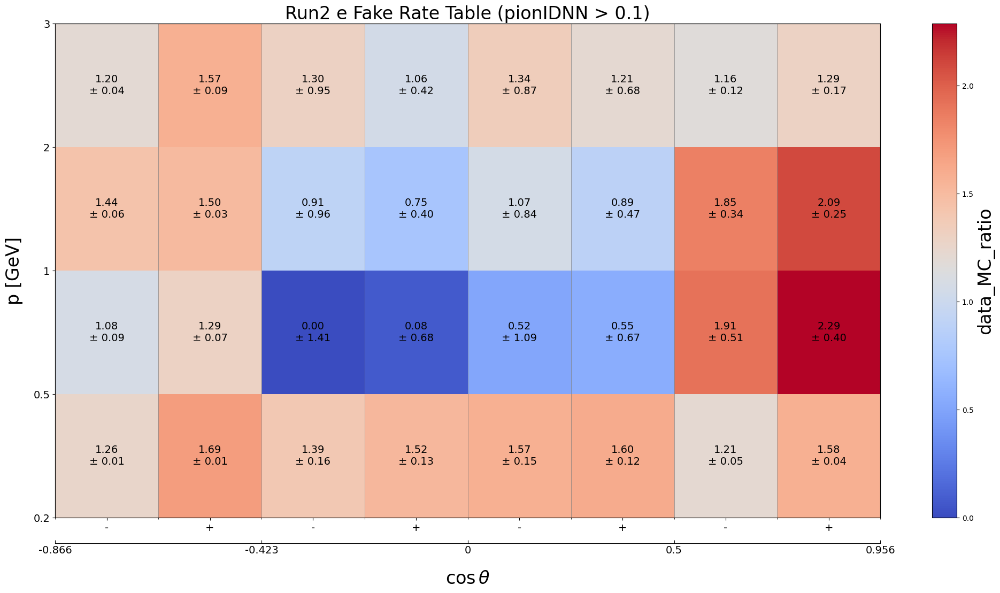

In [79]:
util.plot_PID_weight_heatmap_mpl(
    variable = 'pionIDNN',
    threshold = 0.1,
    widthFactor = 16/9,
    totErr = True,
    fontsize = 14,
    plot_graph = False,
    csv_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_pi_fake_run2_TwophotonEe.csv',
    save_path = '/home/belle/zhangboy/inclusive_R_D/MC16_sys_tables/MC16_pid_tables/e_pi_fake_run2_TwophotonEe.png',)